<h1>The Machine Learning Capstone Project</h1>
<h2>Data analysis on nutrients from animal meat</h2>
<h4>Prepared by: Kun Bi</h4>

<h2>Content</h2>
<ol>
    <li>Scrape two nutrient tables from StatsCan website and perofrm data cleaning.</li>
    <li>Statistical analysis.</li>
    <li>Perform EDA.</li>
    <li>Perform unsupervised KMeans model to cluster the datasets.</li>
    <li>Train the clustered datasets with Supervised models such as LogisticRegression, DecisionTrees, SVM, and KNN.</li>
    <li>Perform predictions on an item from a totally different food source.</li>
</ol>

#### Import Python Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import requests
import matplotlib.pyplot as plt
from bs4 import BeautifulSoup
#!pip install plotly
import plotly.express as px

## Part 1. Scraping Tables.

<h4>Turn a StatsCan <a href="https://www.canada.ca/en/health-canada/services/food-nutrition/healthy-eating/nutrient-data/nutrient-value-some-common-foods-2008.html#a11">website</a> to a webscrape object.</h4>

In [2]:
r=requests.get("https://www.canada.ca/en/health-canada/services/food-nutrition/healthy-eating/nutrient-data/nutrient-value-some-common-foods-2008.html#a11")
print(r)
soup=BeautifulSoup(r.content)

<Response [200]>


#### There are multiple tables regarding to one group of protein. I would focus on fish and meat tables. 

In [3]:
tables=soup.find_all("table",{"class":"subject fontSize75 table-bordered table"})
lst=[]
for table in tables:
    title=table.find("caption").get_text().strip()
    lst.append(title)
print(lst)
fish_indx=lst.index("Fish and Shellfish")
table_fish=tables[fish_indx]
meat_indx=lst.index("Meat and Poultry")
table_meat=tables[meat_indx]

['Baked Goods', 'Vegetables and Vegetable Products', 'Fruit and Fruit Juices', 'Dairy Foods and Other Related Products', 'Eggs and Egg Dishes', 'Fish and Shellfish', 'Meat and Poultry', 'Legumes, Nuts and Seeds', 'Fast Foods', 'Mixed Dishes', 'Soups', 'Fats and Oils', 'Sweets and Sugars', 'Snacks', 'Beverages', 'Miscellaneous']


#### Scrape the Fish and Shellfish table

In [4]:
rows=table_fish.find_all("tr")
lst_length=[]
for row in rows:
    lst_length.append(len(row))     
lst_length    
index_list=list(range(len(lst_length)))
index_list
df_length=pd.DataFrame({"index":index_list,"length":lst_length})
df_length
indx_45=df_length.query("length==45")["index"].tolist()
indx_45[:3]

[0, 3, 4]

In [5]:
rows_tr=table_fish.find_all("tr")
rows45=[]
for num in indx_45:
    rows45.append(rows_tr[num])   
rows45

[<tr>
 <th id="t8hc1"> Food Name </th>
 <th id="t8hc2"> Measure </th>
 <th id="t8hc3"> Weight (g) </th>
 <th id="t8hc4"> Energy (kcal) </th>
 <th id="t8hc5"> Energy (kJ) </th>
 <th id="t8hc6"> Protein (g) </th>
 <th id="t8hc7"> Carbohydrate (g) </th>
 <th id="t8hc8"> Total Fat (g) </th>
 <th id="t8hc9"> Saturated Fat (g) </th>
 <th id="t8hc10"> Polyunsaturated Fat (g) </th>
 <th id="t8hc11"> DHA (g) </th>
 <th id="t8hc12"> EPA (g) </th>
 <th id="t8hc13"> Cholesterol (mg) </th>
 <th id="t8hc14"> Calcium (mg) </th>
 <th id="t8hc15"> Iron (mg) </th>
 <th id="t8hc16"> Sodium (mg) </th>
 <th id="t8hc17"> Potassium (mg) </th>
 <th id="t8hc18"> Phosphorus (mg) </th>
 <th id="t8hc19"> Vitamin A (RAE) </th>
 <th id="t8hc20"> Vitamin D (mcg) </th>
 <th id="t8hc21"> Vitamin B12 (mcg) </th>
 <th id="t8hc22"> Vitamin E (mg) </th>
 </tr>,
 <tr>
 <td headers="h3.1 t8hc1"> Anchovies, canned in oil, drained solids </td>
 <td headers="h3.1 t8hc2"> 2 </td>
 <td headers="h3.1 t8hc3"> 8 </td>
 <td headers=

In [6]:
total_lst=[]
for rows in rows45:
    col_lst=[]
    for row in rows:
        col_lst.append(row.get_text().strip())
    new_lst=[]
    for i in col_lst[1::2]:
        new_lst.append(i)
    total_lst.append(new_lst)
total_lst    

[['Food Name',
  'Measure',
  'Weight (g)',
  'Energy (kcal)',
  'Energy (kJ)',
  'Protein (g)',
  'Carbohydrate (g)',
  'Total Fat (g)',
  'Saturated Fat (g)',
  'Polyunsaturated Fat (g)',
  'DHA (g)',
  'EPA (g)',
  'Cholesterol (mg)',
  'Calcium (mg)',
  'Iron (mg)',
  'Sodium (mg)',
  'Potassium (mg)',
  'Phosphorus (mg)',
  'Vitamin A (RAE)',
  'Vitamin D (mcg)',
  'Vitamin B12 (mcg)',
  'Vitamin E (mg)'],
 ['Anchovies, canned in oil, drained solids',
  '2',
  '8',
  '17',
  '70',
  '2',
  '0',
  '1',
  '0.2',
  '0.2',
  '0.1',
  '0.06',
  '7',
  '19',
  '0.4',
  '293',
  '44',
  '20',
  '1',
  '0.1',
  '0.07',
  '0.3'],
 ['Arctic char, cooked',
  '75\xa0g',
  '75',
  '119',
  '496',
  '20',
  '0',
  '4',
  '0.7',
  '0.9',
  '0.3',
  '0.38',
  'N/A',
  '23',
  '0.4',
  '38',
  'N/A',
  '188',
  '68',
  '2.8',
  'N/A',
  'N/A'],
 ['Bass, mixed species, baked or broiled',
  '75\xa0g',
  '75',
  '110',
  '458',
  '18',
  '0',
  '4',
  '0.8',
  '1',
  '0.34',
  '0.23',
  '65',
  '77',

#### Finally. The fish and shellfish tables has been successfully scraped into a dataframe.

In [7]:
df_fish=pd.DataFrame(total_lst[1:],columns=total_lst[0])
print(df_fish.shape)
df_fish

(61, 22)


,Food Name,Measure,Weight (g),Energy (kcal),Energy (kJ),Protein (g),Carbohydrate (g),Total Fat (g),Saturated Fat (g),Polyunsaturated Fat (g),...,Cholesterol (mg),Calcium (mg),Iron (mg),Sodium (mg),Potassium (mg),Phosphorus (mg),Vitamin A (RAE),Vitamin D (mcg),Vitamin B12 (mcg),Vitamin E (mg)
0,"Anchovies, canned in oil, drained solids",2,8,17,70,2,0,1,0.2,0.2,...,7,19,0.4,293,44,20,1,0.1,0.07,0.3
1,"Arctic char, cooked",75 g,75,119,496,20,0,4,0.7,0.9,...,N/A,23,0.4,38,N/A,188,68,2.8,N/A,N/A
2,"Bass, mixed species, baked or broiled",75 g,75,110,458,18,0,4,0.8,1,...,65,77,1.4,68,342,192,26,N/A,1.73,N/A
3,"Burbot (loche), raw",90 g,90,71,297,16,0,1,0.1,0.3,...,54,22,0.3,63,288,171,5,0.5,0.72,N/A
4,"Catfish, channel, farmed, baked or broiled",75 g,75,114,477,14,0,6,1.3,1,...,48,7,0.6,60,241,184,11,N/A,2.1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56,Fish cake,1,120,240,1004,16,15,12,3.3,2.6,...,63,30,0.8,290,526,201,28,1.5,0.73,0.7
57,"Fish fillet, battered and fried",1,134,265,1108,22,9,15,3.6,3.4,...,71,42,1,133,508,266,23,0.8,1.02,1
58,"Fish sticks, frozen, heated (10 cm x 2.5 cm x ...",3 sticks,83,227,948,13,20,10,2.6,2.6,...,93,17,0.6,485,217,151,26,0.1,1.5,0.4
59,"Shrimp, breaded and fried",6 medium,66,160,668,14,8,8,1.4,3.4,...,117,44,0.8,227,149,144,N/A,N/A,1.23,N/A


In [8]:
df_fish.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61 entries, 0 to 60
Data columns (total 22 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Food Name                61 non-null     object
 1   Measure                  61 non-null     object
 2   Weight (g)               61 non-null     object
 3   Energy (kcal)            61 non-null     object
 4   Energy (kJ)              61 non-null     object
 5   Protein (g)              61 non-null     object
 6   Carbohydrate (g)         61 non-null     object
 7   Total Fat (g)            61 non-null     object
 8   Saturated Fat (g)        61 non-null     object
 9   Polyunsaturated Fat (g)  61 non-null     object
 10  DHA (g)                  61 non-null     object
 11  EPA (g)                  61 non-null     object
 12  Cholesterol (mg)         61 non-null     object
 13  Calcium (mg)             61 non-null     object
 14  Iron (mg)                61 non-null     obj

#### Check each column's values

In [9]:
for col in df_fish.columns:
    print("=================")
    print(f"The column's name is {col}")
    print("=================")
    print(df_fish[col].unique())

The column's name is Food Name
['Anchovies, canned in oil, drained solids' 'Arctic char, cooked'
 'Bass, mixed species, baked or broiled' 'Burbot (loche), raw'
 'Catfish, channel, farmed, baked or broiled'
 'Cisco (lake herring, tullibee), baked or broiled'
 'Cisco (lake herring, tullibee), raw' 'Cod, Atlantic, baked or broiled'
 'Cod, Atlantic, dried and salted, soaked in water' 'Gefiltefish'
 'Grayling, baked or broiled' 'Haddock, baked or broiled'
 'Halibut, Atlantic and Pacific, baked or broiled'
 'Herring, Atlantic, kippered' 'Mackerel, Atlantic, baked or broiled'
 'Ocean Perch, Atlantic, baked or broiled'
 'Pickerel (Walleye), baked or broiled' 'Pike, northern, baked or broiled'
 'Pollock, Atlantic, baked or broiled'
 'Salmon, Atlantic, farmed, baked or broiled'
 'Salmon, chum (keta), baked or broiled'
 'Salmon, chum (keta), canned, drained solids with bone, salted'
 'Salmon, chum (keta), canned, drained solids with bone, unsalted'
 'Salmon, coho, farmed, baked or broiled' 'Salmo

#### Food Name and Measure columns are categotical columns. The rest are going to be converted to numeric columns.

In [10]:
for col in df_fish.columns[2:]:
    df_fish[col]=pd.to_numeric(df_fish[col],errors="coerce")
df_fish.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61 entries, 0 to 60
Data columns (total 22 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Food Name                61 non-null     object 
 1   Measure                  61 non-null     object 
 2   Weight (g)               61 non-null     int64  
 3   Energy (kcal)            61 non-null     int64  
 4   Energy (kJ)              61 non-null     int64  
 5   Protein (g)              61 non-null     int64  
 6   Carbohydrate (g)         60 non-null     float64
 7   Total Fat (g)            59 non-null     float64
 8   Saturated Fat (g)        57 non-null     float64
 9   Polyunsaturated Fat (g)  57 non-null     float64
 10  DHA (g)                  56 non-null     float64
 11  EPA (g)                  53 non-null     float64
 12  Cholesterol (mg)         56 non-null     float64
 13  Calcium (mg)             61 non-null     int64  
 14  Iron (mg)                61 

#### Check the columns' values again. 

In [11]:
for col in df_fish.columns:
    print("=========================")
    print(f"The column is {col}")
    print("=========================")
    print(df_fish[col].unique())

The column is Food Name
['Anchovies, canned in oil, drained solids' 'Arctic char, cooked'
 'Bass, mixed species, baked or broiled' 'Burbot (loche), raw'
 'Catfish, channel, farmed, baked or broiled'
 'Cisco (lake herring, tullibee), baked or broiled'
 'Cisco (lake herring, tullibee), raw' 'Cod, Atlantic, baked or broiled'
 'Cod, Atlantic, dried and salted, soaked in water' 'Gefiltefish'
 'Grayling, baked or broiled' 'Haddock, baked or broiled'
 'Halibut, Atlantic and Pacific, baked or broiled'
 'Herring, Atlantic, kippered' 'Mackerel, Atlantic, baked or broiled'
 'Ocean Perch, Atlantic, baked or broiled'
 'Pickerel (Walleye), baked or broiled' 'Pike, northern, baked or broiled'
 'Pollock, Atlantic, baked or broiled'
 'Salmon, Atlantic, farmed, baked or broiled'
 'Salmon, chum (keta), baked or broiled'
 'Salmon, chum (keta), canned, drained solids with bone, salted'
 'Salmon, chum (keta), canned, drained solids with bone, unsalted'
 'Salmon, coho, farmed, baked or broiled' 'Salmon, eggs

#### The null values will be kept since null values would explain the missing nutrition from certain fish proteins

In [12]:
df_fish.head(2)

,Food Name,Measure,Weight (g),Energy (kcal),Energy (kJ),Protein (g),Carbohydrate (g),Total Fat (g),Saturated Fat (g),Polyunsaturated Fat (g),...,Cholesterol (mg),Calcium (mg),Iron (mg),Sodium (mg),Potassium (mg),Phosphorus (mg),Vitamin A (RAE),Vitamin D (mcg),Vitamin B12 (mcg),Vitamin E (mg)
0,"Anchovies, canned in oil, drained solids",2,8,17,70,2,0.0,1.0,0.2,0.2,...,7.0,19,0.4,293.0,44.0,20.0,1.0,0.1,0.07,0.3
1,"Arctic char, cooked",75 g,75,119,496,20,0.0,4.0,0.7,0.9,...,NaN,23,0.4,38.0,NaN,188.0,68.0,2.8,NaN,NaN


##### Create per gram measurements for fish table's all the numeric values

In [13]:
# create a copy of the original dataframe
numeric_cols=df_fish.iloc[:,3:].columns

df_fish1=df_fish.copy().drop(numeric_cols,axis=1)
for col in numeric_cols:
     df_fish1[f"{col} per grams"]=df_fish[col]/df_fish["Weight (g)"]
df_fish1.head()    

,Food Name,Measure,Weight (g),Energy (kcal) per grams,Energy (kJ) per grams,Protein (g) per grams,Carbohydrate (g) per grams,Total Fat (g) per grams,Saturated Fat (g) per grams,Polyunsaturated Fat (g) per grams,...,Cholesterol (mg) per grams,Calcium (mg) per grams,Iron (mg) per grams,Sodium (mg) per grams,Potassium (mg) per grams,Phosphorus (mg) per grams,Vitamin A (RAE) per grams,Vitamin D (mcg) per grams,Vitamin B12 (mcg) per grams,Vitamin E (mg) per grams
0,"Anchovies, canned in oil, drained solids",2,8,2.125000,8.750000,0.250000,0.0,0.125000,0.025000,0.025000,...,0.875000,2.375000,0.050000,36.625000,5.500000,2.500000,0.125000,0.012500,0.008750,0.037500
1,"Arctic char, cooked",75 g,75,1.586667,6.613333,0.266667,0.0,0.053333,0.009333,0.012000,...,NaN,0.306667,0.005333,0.506667,NaN,2.506667,0.906667,0.037333,NaN,NaN
2,"Bass, mixed species, baked or broiled",75 g,75,1.466667,6.106667,0.240000,0.0,0.053333,0.010667,0.013333,...,0.866667,1.026667,0.018667,0.906667,4.560000,2.560000,0.346667,NaN,0.023067,NaN
3,"Burbot (loche), raw",90 g,90,0.788889,3.300000,0.177778,0.0,0.011111,0.001111,0.003333,...,0.600000,0.244444,0.003333,0.700000,3.200000,1.900000,0.055556,0.005556,0.008000,NaN
4,"Catfish, channel, farmed, baked or broiled",75 g,75,1.520000,6.360000,0.186667,0.0,0.080000,0.017333,0.013333,...,0.640000,0.093333,0.008000,0.800000,3.213333,2.453333,0.146667,NaN,0.028000,0.013333


#### Find the name and index of the labels.

In [14]:
table_fish.find_all("tr",{"class":"row-even"})

[<tr class="row-even">
 <th colspan="22" id="h3.1"> <strong> Fish </strong> </th>
 </tr>,
 <tr class="row-even">
 <th colspan="22" id="h44.1"> <strong> Shellfish </strong> </th>
 </tr>,
 <tr class="row-even">
 <th colspan="22" id="h57.1"> <strong> Fish Products </strong> </th>
 </tr>]

In [15]:
label_lst=[]
for label in table_fish.find_all("tr",{"class":"row-even"}):
    label_lst.append(label.get_text().replace("\n","").strip())
label_lst

['Fish', 'Shellfish', 'Fish Products']

In [16]:
#df_fish1.head(1)
df_length.query("length!=45").index

Index([1, 2, 43, 56, 66], dtype='int64')

#### Attach sub-category labels to each group.

In [17]:
df_fish11=df_fish1.iloc[:40]
df_fish11["Label"]="Fish"
df_fish22=df_fish1.iloc[40:52]
df_fish22["Label"]="Shellfish"
df_fish33=df_fish1.iloc[52:]
df_fish33["Label"]="Fish Products"
df_fish_total=pd.concat([df_fish11,df_fish22,df_fish33],axis=0)
df_fish_total

C:\Users\Kun\AppData\Local\Temp\ipykernel_12684\3798645278.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_fish11["Label"]="Fish"
C:\Users\Kun\AppData\Local\Temp\ipykernel_12684\3798645278.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_fish22["Label"]="Shellfish"
C:\Users\Kun\AppData\Local\Temp\ipykernel_12684\3798645278.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in 

,Food Name,Measure,Weight (g),Energy (kcal) per grams,Energy (kJ) per grams,Protein (g) per grams,Carbohydrate (g) per grams,Total Fat (g) per grams,Saturated Fat (g) per grams,Polyunsaturated Fat (g) per grams,...,Calcium (mg) per grams,Iron (mg) per grams,Sodium (mg) per grams,Potassium (mg) per grams,Phosphorus (mg) per grams,Vitamin A (RAE) per grams,Vitamin D (mcg) per grams,Vitamin B12 (mcg) per grams,Vitamin E (mg) per grams,Label
0,"Anchovies, canned in oil, drained solids",2,8,2.125000,8.750000,0.250000,0.000000,0.125000,0.025000,0.025000,...,2.375000,0.050000,36.625000,5.500000,2.500000,0.125000,0.012500,0.008750,0.037500,Fish
1,"Arctic char, cooked",75 g,75,1.586667,6.613333,0.266667,0.000000,0.053333,0.009333,0.012000,...,0.306667,0.005333,0.506667,NaN,2.506667,0.906667,0.037333,NaN,NaN,Fish
2,"Bass, mixed species, baked or broiled",75 g,75,1.466667,6.106667,0.240000,0.000000,0.053333,0.010667,0.013333,...,1.026667,0.018667,0.906667,4.560000,2.560000,0.346667,NaN,0.023067,NaN,Fish
3,"Burbot (loche), raw",90 g,90,0.788889,3.300000,0.177778,0.000000,0.011111,0.001111,0.003333,...,0.244444,0.003333,0.700000,3.200000,1.900000,0.055556,0.005556,0.008000,NaN,Fish
4,"Catfish, channel, farmed, baked or broiled",75 g,75,1.520000,6.360000,0.186667,0.000000,0.080000,0.017333,0.013333,...,0.093333,0.008000,0.800000,3.213333,2.453333,0.146667,NaN,0.028000,0.013333,Fish
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56,Fish cake,1,120,2.000000,8.366667,0.133333,0.125000,0.100000,0.027500,0.021667,...,0.250000,0.006667,2.416667,4.383333,1.675000,0.233333,0.012500,0.006083,0.005833,Fish Products
57,"Fish fillet, battered and fried",1,134,1.977612,8.268657,0.164179,0.067164,0.111940,0.026866,0.025373,...,0.313433,0.007463,0.992537,3.791045,1.985075,0.171642,0.005970,0.007612,0.007463,Fish Products
58,"Fish sticks, frozen, heated (10 cm x 2.5 cm x ...",3 sticks,83,2.734940,11.421687,0.156627,0.240964,0.120482,0.031325,0.031325,...,0.204819,0.007229,5.843373,2.614458,1.819277,0.313253,0.001205,0.018072,0.004819,Fish Products
59,"Shrimp, breaded and fried",6 medium,66,2.424242,10.121212,0.212121,0.121212,0.121212,0.021212,0.051515,...,0.666667,0.012121,3.439394,2.257576,2.181818,NaN,NaN,0.018636,NaN,Fish Products


In [18]:
df_fish_total.shape

(61, 23)

#### Scrape the Meat and Poultry table

In [19]:
# convert all the meat and poultry data points to a list
meat_lst=[]
for tr in table_meat.find_all("tr"):
    lst=[]
    for th in tr:
        lst.append(th.get_text().replace("\n","").strip())
    meat_lst.append(lst[1::2])
meat_lst
# create a lsit contain the index of the abnormal rows
row_length=[]
for row in meat_lst:
    row_length.append(len(row))
df_index_meat=pd.DataFrame({"index":list(range(len(row_length))),"Length":row_length})
df_index_meat
# Get rid of the abnormal rows index by appending normal rows into a new lst
meat_indx=df_index_meat.query("Length==22")["index"]
new_lst=[]
for num in meat_indx.tolist():
    new_lst.append(meat_lst[num])
new_lst  
# Turn the list into a dataframe
df_meat=pd.DataFrame(new_lst[1:],columns=new_lst[0])
df_meat.head(2)

,Food Name,Measure,Weight (g),Energy (kcal),Energy (kJ),Protein (g),Carbohydrate (g),Total Fat (g),Saturated Fat (g),Monounsaturated Fat (g),...,Iron (mg),Sodium (mg),Potassium (mg),Magnesium (mg),Phosphorus (mg),Vitamin A (RAE),Vitamin D (mcg),Vitamin B12 (mcg),Folate (DFE),Vitamin E (mg)
0,"Blade roast, lean + fat, braised",75 g,75,200,834,26,0,10,4,5,...,2.5,46,202,18,142,0,0.5,2.38,4,0.1
1,"Blade steak, lean + fat, braised",75 g,75,227,947,23,0,14,5.7,7.1,...,2.4,49,178,17,138,0,0.5,2,4,0.2


In [20]:
df_meat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142 entries, 0 to 141
Data columns (total 22 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Food Name                142 non-null    object
 1   Measure                  142 non-null    object
 2   Weight (g)               142 non-null    object
 3   Energy (kcal)            142 non-null    object
 4   Energy (kJ)              142 non-null    object
 5   Protein (g)              142 non-null    object
 6   Carbohydrate (g)         142 non-null    object
 7   Total Fat (g)            142 non-null    object
 8   Saturated Fat (g)        142 non-null    object
 9   Monounsaturated Fat (g)  142 non-null    object
 10  Polyunsaturated Fat (g)  142 non-null    object
 11  Cholesterol (mg)         142 non-null    object
 12  Iron (mg)                142 non-null    object
 13  Sodium (mg)              142 non-null    object
 14  Potassium (mg)           142 non-null    o

#### Only Food Name and Measure are categorical columns, The rest will be turned into numeric columns

In [21]:
for col in df_meat.columns[2:]:
    df_meat[col]=pd.to_numeric(df_meat[col],errors="coerce")
df_meat.info()    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142 entries, 0 to 141
Data columns (total 22 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Food Name                142 non-null    object 
 1   Measure                  142 non-null    object 
 2   Weight (g)               142 non-null    int64  
 3   Energy (kcal)            142 non-null    int64  
 4   Energy (kJ)              142 non-null    int64  
 5   Protein (g)              142 non-null    int64  
 6   Carbohydrate (g)         127 non-null    float64
 7   Total Fat (g)            141 non-null    float64
 8   Saturated Fat (g)        139 non-null    float64
 9   Monounsaturated Fat (g)  137 non-null    float64
 10  Polyunsaturated Fat (g)  137 non-null    float64
 11  Cholesterol (mg)         138 non-null    float64
 12  Iron (mg)                141 non-null    float64
 13  Sodium (mg)              142 non-null    int64  
 14  Potassium (mg)           1

#### Create per gram columns for all the numeric columns


In [22]:
# df_meat1=df_meat.copy().iloc[:,:3]
# df_meat1
# for col in df_meat.iloc[:,3:].columns:
#     df_meat1[f"{col} per gram"]=df_meat[col]/df_meat["Weight (g)"]
# df_meat1    

numeric_cols=df_meat.iloc[:,3:].columns

df_meat1=df_meat.copy().drop(numeric_cols,axis=1)
for col in numeric_cols:
     df_meat1[f"{col} per grams"]=df_meat[col]/df_meat["Weight (g)"]
df_meat1.head() 

,Food Name,Measure,Weight (g),Energy (kcal) per grams,Energy (kJ) per grams,Protein (g) per grams,Carbohydrate (g) per grams,Total Fat (g) per grams,Saturated Fat (g) per grams,Monounsaturated Fat (g) per grams,...,Iron (mg) per grams,Sodium (mg) per grams,Potassium (mg) per grams,Magnesium (mg) per grams,Phosphorus (mg) per grams,Vitamin A (RAE) per grams,Vitamin D (mcg) per grams,Vitamin B12 (mcg) per grams,Folate (DFE) per grams,Vitamin E (mg) per grams
0,"Blade roast, lean + fat, braised",75 g,75,2.666667,11.120000,0.346667,0.0,0.133333,0.053333,0.066667,...,0.033333,0.613333,2.693333,0.240000,1.893333,0.0,0.006667,0.031733,0.053333,0.001333
1,"Blade steak, lean + fat, braised",75 g,75,3.026667,12.626667,0.306667,0.0,0.186667,0.076000,0.094667,...,0.032000,0.653333,2.373333,0.226667,1.840000,0.0,0.006667,0.026667,0.053333,0.002667
2,"Composite, roast, lean + fat, cooked",75 g,75,2.413333,10.080000,0.320000,0.0,0.106667,0.046667,0.056000,...,0.030667,0.533333,3.066667,0.253333,2.066667,0.0,0.006667,0.025200,0.053333,0.001333
3,"Composite, steak, lean + fat, cooked",75 g,75,2.613333,10.920000,0.333333,0.0,0.120000,0.052000,0.065333,...,0.032000,0.533333,2.666667,0.240000,1.973333,0.0,0.006667,0.023733,0.053333,0.001333
4,"Cross rib roast, lean + fat, braised",75 g,75,2.626667,11.000000,0.360000,0.0,0.120000,0.048000,0.060000,...,0.034667,0.693333,3.226667,0.280000,2.186667,0.0,0.006667,0.025200,0.066667,0.008000


#### Get the name and the index of the labels.

#### Check meat table each column's unique values

In [23]:
for col in df_meat1.columns:
    print("=========================")
    print(f"The column is {col}")
    print("=========================")
    print(df_meat1[col].unique())

The column is Food Name
['Blade roast, lean + fat, braised' 'Blade steak, lean + fat, braised'
 'Composite, roast, lean + fat, cooked'
 'Composite, steak, lean + fat, cooked'
 'Cross rib roast, lean + fat, braised'
 'Eye of round roast, lean + fat, roasted'
 'Eye of round steak, lean + fat, braised'
 'Flank steak, lean + fat, braised'
 'Ground, extra lean, crumbled, pan-fried'
 'Ground, lean, crumbled, pan-fried' 'Ground, medium, crumbled, pan-fried'
 'Ground, regular, crumbled, pan-fried'
 'Inside (top) round roast, lean + fat, roasted'
 'Inside (top) round steak, lean + fat, braised'
 'Outside (bottom) round roast, lean + fat, roasted'
 'Outside (bottom) round steak, lean + fat, braised'
 'Rib eye steak, lean + fat, broiled' 'Rib steak, lean + fat, broiled'
 'Rump roast, lean + fat, broiled' 'Short ribs, lean + fat, simmered'
 'Sirloin tip roast, lean + fat, roasted'
 'Standing rib roast, lean + fat, roasted' 'Stewing beef, lean, simmered'
 'Strip loin ( New York ) steak, lean + fat,

In [24]:
label_lst_meat=[]
for label in table_meat.find_all("tr",{"class":"row-even"}):
    label_lst_meat.append(label.get_text().replace("\n","").strip())
label_lst_meat

['Beef',
 'Veal',
 'Pork',
 'Lamb',
 'Poultry and Game Birds',
 'Game Meats and Other Meats',
 'Liver and Organ Meats',
 'Processed Meat Products']

In [25]:
df_index_meat.query("Length!=22")["index"].tolist()[:-1]

[1, 2, 30, 40, 53, 64, 87, 101, 109]

#### Attach sub-category labels to each row

In [26]:
#df_meat.iloc[93:100]
df_meat11=df_meat1.iloc[:27]
df_meat11.loc[:,"Label"]="Beef"
df_meat22=df_meat1.iloc[27:36]
df_meat22.loc[:,"Label"]="Veal"
df_meat33=df_meat1.iloc[36:48]
df_meat33.loc[:,"Label"]="Pork"
df_meat44=df_meat1.iloc[48:58]
df_meat44.loc[:,"Label"]="Lamb"
df_meat55=df_meat1.iloc[58:80]
df_meat55.loc[:,"Label"]="Poultry and Game Birds"
df_meat66=df_meat1.iloc[80:93]
df_meat66.loc[:,"Label"]="Game Meats and Other Meats"
df_meat77=df_meat1.iloc[93:100]
df_meat77.loc[:,"Label"]="Liver and Organ Meats"
df_meat88=df_meat1.iloc[100:]
df_meat88.loc[:,"Label"]="Processed Meat Products"

C:\Users\Kun\AppData\Local\Temp\ipykernel_12684\2075723090.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_meat11.loc[:,"Label"]="Beef"
C:\Users\Kun\AppData\Local\Temp\ipykernel_12684\2075723090.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_meat22.loc[:,"Label"]="Veal"
C:\Users\Kun\AppData\Local\Temp\ipykernel_12684\2075723090.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cave

In [27]:
lst=[df_meat11,df_meat22,df_meat33,df_meat44,df_meat55,df_meat66,df_meat77,df_meat88]
df_meat_total=df_meat11.iloc[:0]
for df in lst:
    df_meat_total=pd.concat([df_meat_total,df],axis=0)
df_meat_total.head()    


,Food Name,Measure,Weight (g),Energy (kcal) per grams,Energy (kJ) per grams,Protein (g) per grams,Carbohydrate (g) per grams,Total Fat (g) per grams,Saturated Fat (g) per grams,Monounsaturated Fat (g) per grams,...,Sodium (mg) per grams,Potassium (mg) per grams,Magnesium (mg) per grams,Phosphorus (mg) per grams,Vitamin A (RAE) per grams,Vitamin D (mcg) per grams,Vitamin B12 (mcg) per grams,Folate (DFE) per grams,Vitamin E (mg) per grams,Label
0,"Blade roast, lean + fat, braised",75 g,75,2.666667,11.120000,0.346667,0.0,0.133333,0.053333,0.066667,...,0.613333,2.693333,0.240000,1.893333,0.0,0.006667,0.031733,0.053333,0.001333,Beef
1,"Blade steak, lean + fat, braised",75 g,75,3.026667,12.626667,0.306667,0.0,0.186667,0.076000,0.094667,...,0.653333,2.373333,0.226667,1.840000,0.0,0.006667,0.026667,0.053333,0.002667,Beef
2,"Composite, roast, lean + fat, cooked",75 g,75,2.413333,10.080000,0.320000,0.0,0.106667,0.046667,0.056000,...,0.533333,3.066667,0.253333,2.066667,0.0,0.006667,0.025200,0.053333,0.001333,Beef
3,"Composite, steak, lean + fat, cooked",75 g,75,2.613333,10.920000,0.333333,0.0,0.120000,0.052000,0.065333,...,0.533333,2.666667,0.240000,1.973333,0.0,0.006667,0.023733,0.053333,0.001333,Beef
4,"Cross rib roast, lean + fat, braised",75 g,75,2.626667,11.000000,0.360000,0.0,0.120000,0.048000,0.060000,...,0.693333,3.226667,0.280000,2.186667,0.0,0.006667,0.025200,0.066667,0.008000,Beef


In [28]:
df_meat_total.tail()

,Food Name,Measure,Weight (g),Energy (kcal) per grams,Energy (kJ) per grams,Protein (g) per grams,Carbohydrate (g) per grams,Total Fat (g) per grams,Saturated Fat (g) per grams,Monounsaturated Fat (g) per grams,...,Sodium (mg) per grams,Potassium (mg) per grams,Magnesium (mg) per grams,Phosphorus (mg) per grams,Vitamin A (RAE) per grams,Vitamin D (mcg) per grams,Vitamin B12 (mcg) per grams,Folate (DFE) per grams,Vitamin E (mg) per grams,Label
137,"Vienna sausage (cocktail), beef and pork, canned",3,48,2.291667,9.625000,0.104167,0.020833,0.187500,0.070833,0.095833,...,9.687500,1.000000,0.062500,0.500000,0.000000,0.008333,0.010208,0.041667,0.002083,Processed Meat Products
138,"Wiener (frankfurter), beef",1,38,2.736842,11.473684,0.131579,0.052632,0.210526,0.086842,0.105263,...,9.026316,1.421053,0.131579,1.578947,0.000000,0.007895,0.017105,0.052632,0.002632,Processed Meat Products
139,"Wiener (frankfurter), beef and pork",1,38,2.815789,11.815789,0.131579,0.052632,0.236842,0.089474,0.113158,...,9.842105,1.815789,0.105263,0.842105,0.000000,0.007895,0.012895,0.052632,0.002632,Processed Meat Products
140,"Wiener (frankfurter), beef and pork, light",1,38,1.526316,6.368421,0.105263,0.052632,0.105263,0.036842,0.047368,...,12.394737,1.473684,0.105263,1.394737,0.000000,0.002632,0.012895,0.052632,NaN,Processed Meat Products
141,"Wiener (frankfurter), chicken",1,38,2.447368,10.263158,0.105263,0.052632,0.184211,0.055263,0.084211,...,13.526316,0.842105,0.105263,1.052632,0.368421,0.005263,0.002368,0.052632,0.002632,Processed Meat Products


#### Concatenate both fish and meat dataframes

In [29]:
df_total=pd.concat([df_fish_total,df_meat_total],axis=0,join="outer")
df_total.head()

,Food Name,Measure,Weight (g),Energy (kcal) per grams,Energy (kJ) per grams,Protein (g) per grams,Carbohydrate (g) per grams,Total Fat (g) per grams,Saturated Fat (g) per grams,Polyunsaturated Fat (g) per grams,...,Potassium (mg) per grams,Phosphorus (mg) per grams,Vitamin A (RAE) per grams,Vitamin D (mcg) per grams,Vitamin B12 (mcg) per grams,Vitamin E (mg) per grams,Label,Monounsaturated Fat (g) per grams,Magnesium (mg) per grams,Folate (DFE) per grams
0,"Anchovies, canned in oil, drained solids",2,8,2.125000,8.750000,0.250000,0.0,0.125000,0.025000,0.025000,...,5.500000,2.500000,0.125000,0.012500,0.008750,0.037500,Fish,NaN,NaN,NaN
1,"Arctic char, cooked",75 g,75,1.586667,6.613333,0.266667,0.0,0.053333,0.009333,0.012000,...,NaN,2.506667,0.906667,0.037333,NaN,NaN,Fish,NaN,NaN,NaN
2,"Bass, mixed species, baked or broiled",75 g,75,1.466667,6.106667,0.240000,0.0,0.053333,0.010667,0.013333,...,4.560000,2.560000,0.346667,NaN,0.023067,NaN,Fish,NaN,NaN,NaN
3,"Burbot (loche), raw",90 g,90,0.788889,3.300000,0.177778,0.0,0.011111,0.001111,0.003333,...,3.200000,1.900000,0.055556,0.005556,0.008000,NaN,Fish,NaN,NaN,NaN
4,"Catfish, channel, farmed, baked or broiled",75 g,75,1.520000,6.360000,0.186667,0.0,0.080000,0.017333,0.013333,...,3.213333,2.453333,0.146667,NaN,0.028000,0.013333,Fish,NaN,NaN,NaN


#### Keep the null valuse as it suggests that such a nutrient is missing from the protein.

In [30]:
# Meat doesn't have DHA (g) per grams, EPA (g) per grams, Calcium (mg) per grams.
# Fish doesn't have Monounsaturated Fat (g) per grams, Magnesium (mg) per grams, Folate (DFE) per grams.

## Step 2. Perform Statistical Analysis.

In [31]:
df_total.info()

<class 'pandas.core.frame.DataFrame'>
Index: 203 entries, 0 to 141
Data columns (total 26 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Food Name                          203 non-null    object 
 1   Measure                            203 non-null    object 
 2   Weight (g)                         203 non-null    int64  
 3   Energy (kcal) per grams            203 non-null    float64
 4   Energy (kJ) per grams              203 non-null    float64
 5   Protein (g) per grams              203 non-null    float64
 6   Carbohydrate (g) per grams         187 non-null    float64
 7   Total Fat (g) per grams            200 non-null    float64
 8   Saturated Fat (g) per grams        196 non-null    float64
 9   Polyunsaturated Fat (g) per grams  194 non-null    float64
 10  DHA (g) per grams                  56 non-null     float64
 11  EPA (g) per grams                  53 non-null     float64
 12 

In [32]:
df_total.describe()

,Weight (g),Energy (kcal) per grams,Energy (kJ) per grams,Protein (g) per grams,Carbohydrate (g) per grams,Total Fat (g) per grams,Saturated Fat (g) per grams,Polyunsaturated Fat (g) per grams,DHA (g) per grams,EPA (g) per grams,...,Sodium (mg) per grams,Potassium (mg) per grams,Phosphorus (mg) per grams,Vitamin A (RAE) per grams,Vitamin D (mcg) per grams,Vitamin B12 (mcg) per grams,Vitamin E (mg) per grams,Monounsaturated Fat (g) per grams,Magnesium (mg) per grams,Folate (DFE) per grams
count,203.000000,203.000000,203.000000,203.000000,187.000000,200.000000,196.000000,194.000000,56.000000,53.000000,...,200.000000,200.000000,195.000000,195.000000,164.000000,183.000000,146.000000,137.000000,140.000000,125.000000
mean,69.610837,2.073261,8.661503,0.239417,0.014786,0.112432,0.039983,0.014917,0.004689,0.003191,...,3.759551,3.189604,2.233107,1.324985,0.015259,0.040058,0.005958,0.059437,0.222756,0.175573
std,17.293943,0.848774,3.552277,0.066961,0.033370,0.092245,0.038219,0.012686,0.005852,0.004147,...,5.326853,1.258176,0.822357,8.951066,0.030593,0.109105,0.007886,0.044520,0.062028,0.626111
min,8.000000,0.595238,2.464286,0.047619,0.000000,0.011111,0.001111,0.000000,0.000260,0.000185,...,0.306667,0.842105,0.500000,0.000000,0.000000,0.002143,0.000000,0.001786,0.000000,0.000000
25%,75.000000,1.468627,6.097451,0.192659,0.000000,0.040000,0.012000,0.005333,0.001392,0.001061,...,0.636667,2.463333,1.746667,0.000000,0.003393,0.008575,0.002632,0.025333,0.185455,0.052632
50%,75.000000,1.946667,8.066667,0.240000,0.000000,0.088947,0.026766,0.010667,0.002708,0.001905,...,0.866667,3.232738,2.093333,0.026667,0.006667,0.018636,0.003256,0.049333,0.240000,0.066667
75%,75.000000,2.586667,10.786667,0.280000,0.013333,0.160179,0.056333,0.020713,0.006198,0.004133,...,5.323333,3.750141,2.506667,0.226667,0.010667,0.028667,0.006667,0.084211,0.266667,0.086957
max,134.000000,5.676471,23.764706,0.400000,0.240964,0.558824,0.244118,0.075000,0.038750,0.027500,...,36.625000,13.717391,6.266667,83.259259,0.226667,0.988833,0.068750,0.226471,0.360000,5.600000


#### Construct histogram for neutrient features.

C:\Users\Kun\AppData\Local\Temp\ipykernel_12684\1784062718.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(20,10))


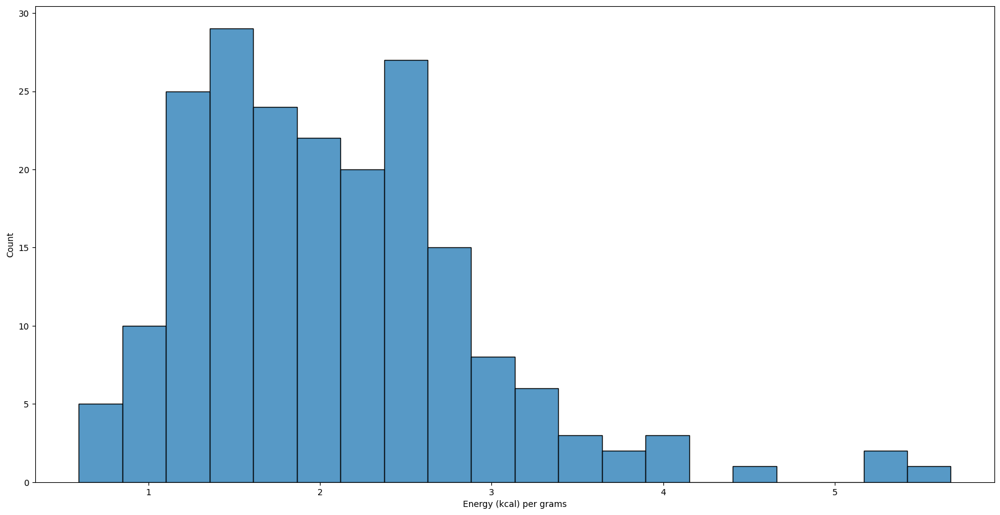

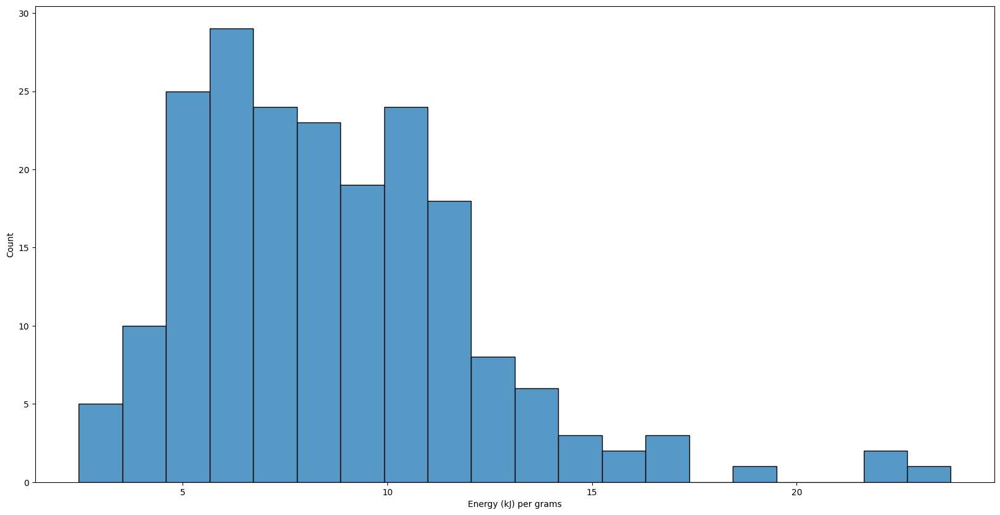

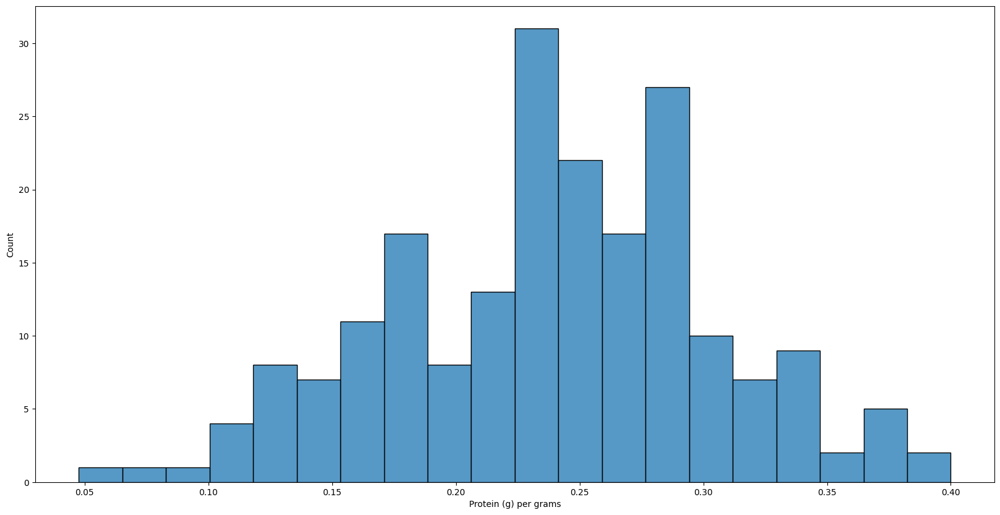

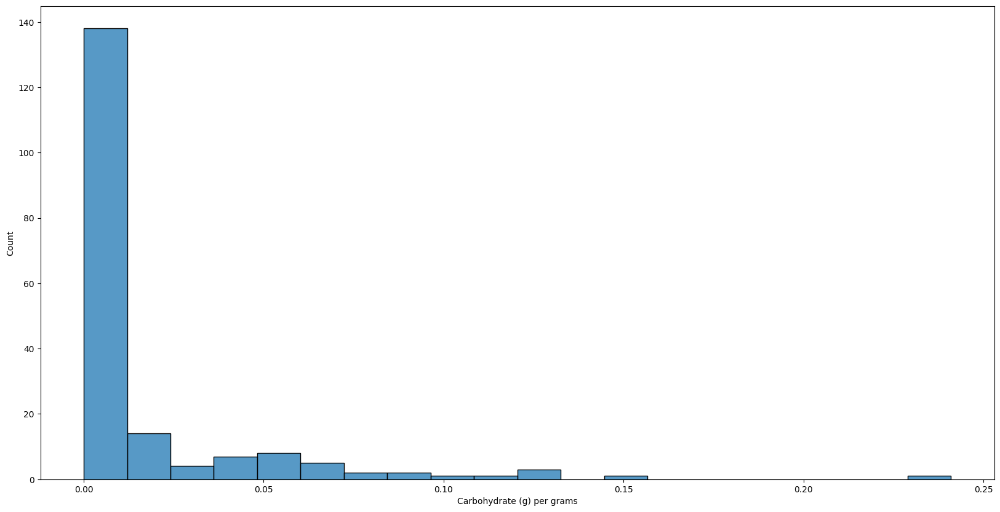

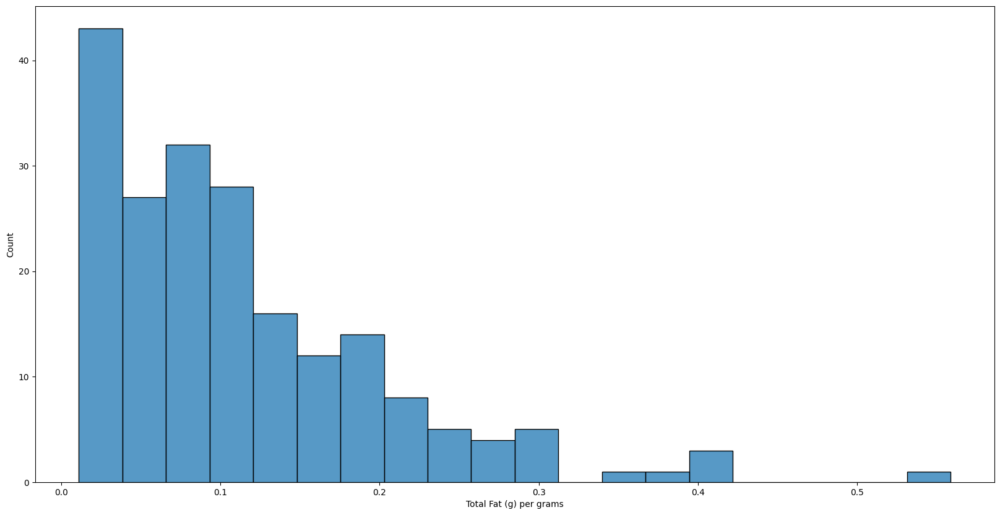

...

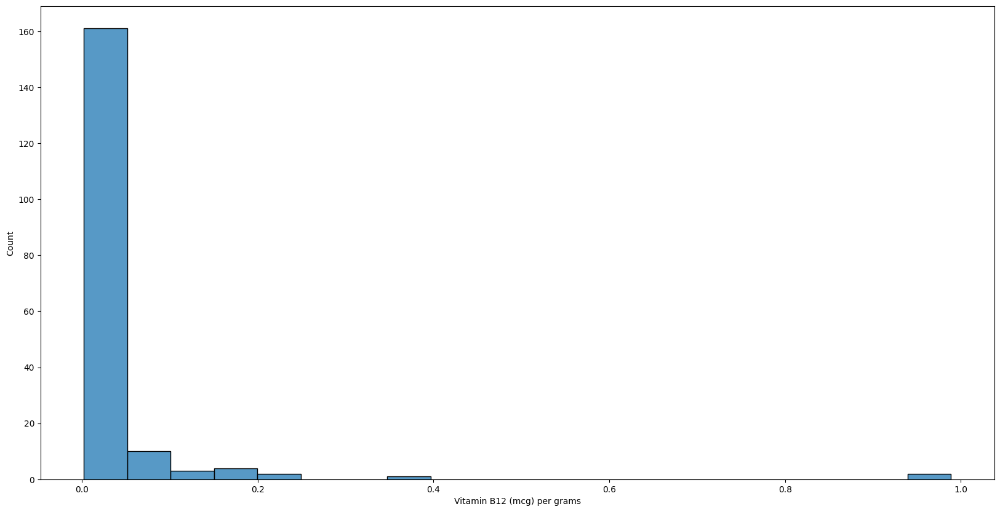

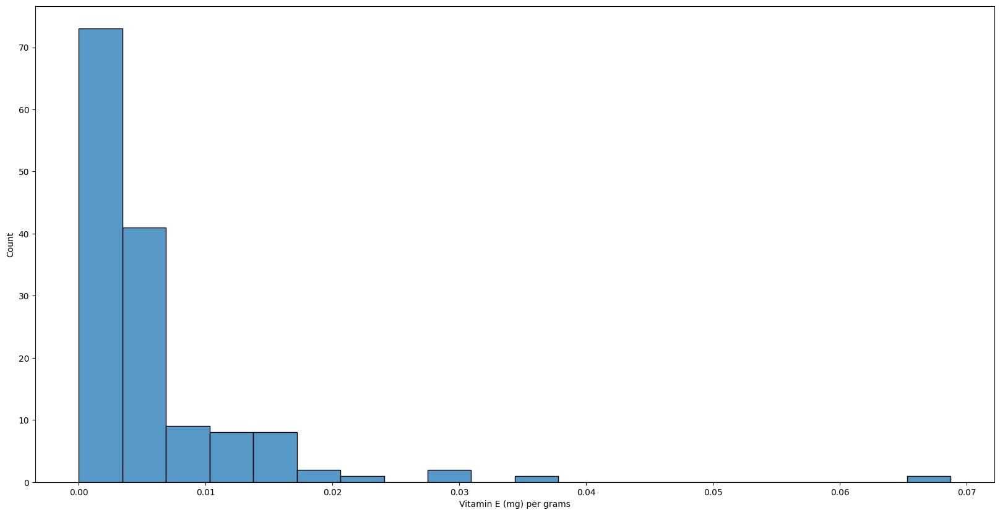

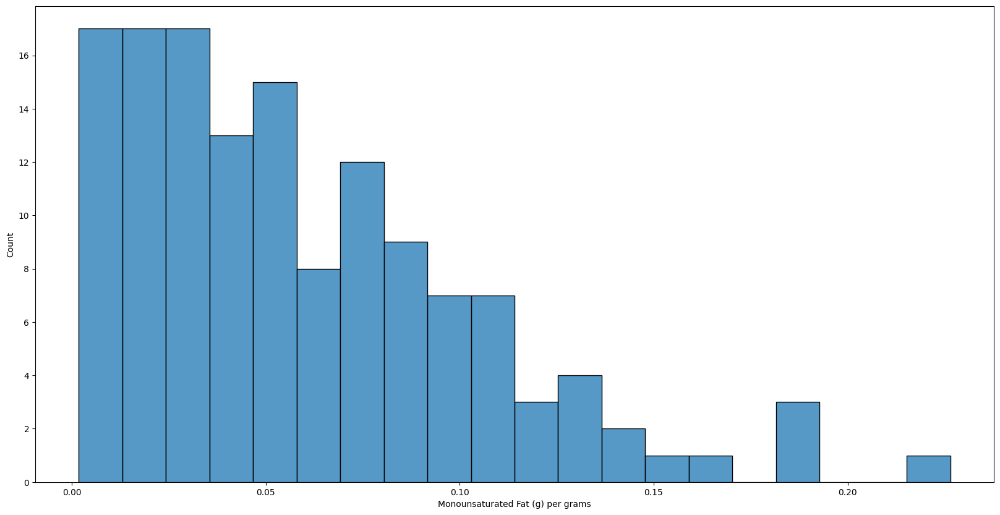

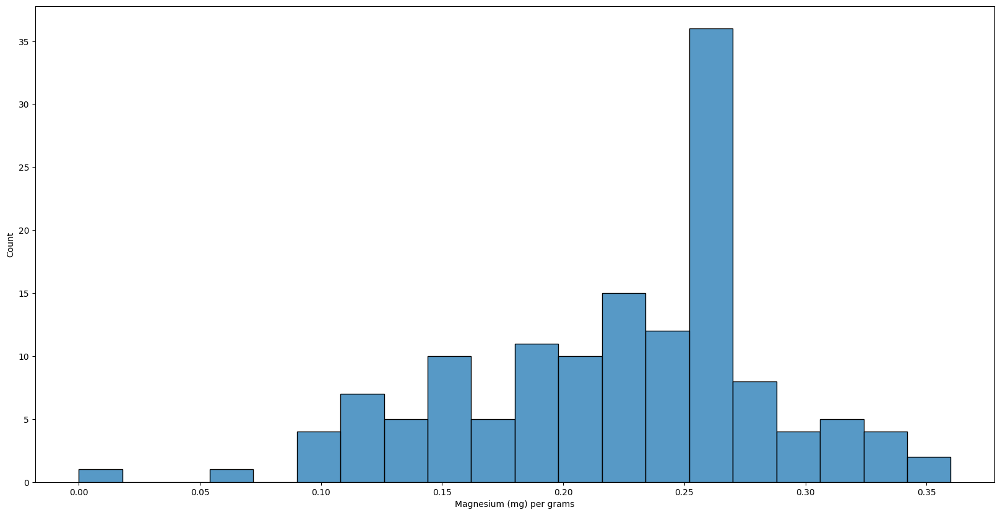

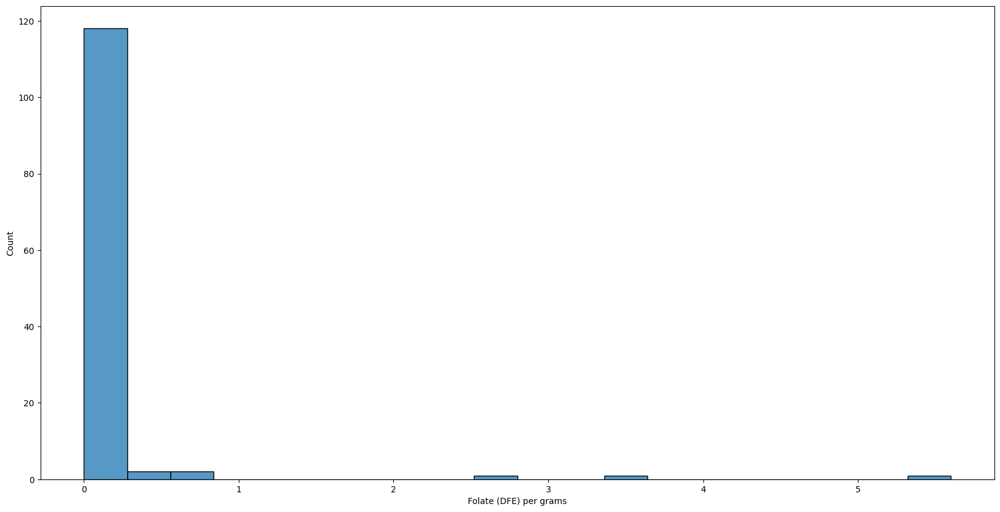

In [33]:
for col in df_total.drop("Weight (g)",axis=1).select_dtypes("number").columns:
    plt.figure(figsize=(20,10))
    sns.histplot(df_total[col],bins=20)

##### Engergy, protein, potussium and phosphorus per grams resemble normal distribution, Magnesium are left skewed, but other features are right skewed.

In [34]:
df_total.head(2)

,Food Name,Measure,Weight (g),Energy (kcal) per grams,Energy (kJ) per grams,Protein (g) per grams,Carbohydrate (g) per grams,Total Fat (g) per grams,Saturated Fat (g) per grams,Polyunsaturated Fat (g) per grams,...,Potassium (mg) per grams,Phosphorus (mg) per grams,Vitamin A (RAE) per grams,Vitamin D (mcg) per grams,Vitamin B12 (mcg) per grams,Vitamin E (mg) per grams,Label,Monounsaturated Fat (g) per grams,Magnesium (mg) per grams,Folate (DFE) per grams
0,"Anchovies, canned in oil, drained solids",2,8,2.125000,8.750000,0.250000,0.0,0.125000,0.025000,0.025,...,5.5,2.500000,0.125000,0.012500,0.00875,0.0375,Fish,NaN,NaN,NaN
1,"Arctic char, cooked",75 g,75,1.586667,6.613333,0.266667,0.0,0.053333,0.009333,0.012,...,NaN,2.506667,0.906667,0.037333,NaN,NaN,Fish,NaN,NaN,NaN


In [35]:
# Top 10 food 
# Top 10 food for each category

#### Plotting boxplot for outliers

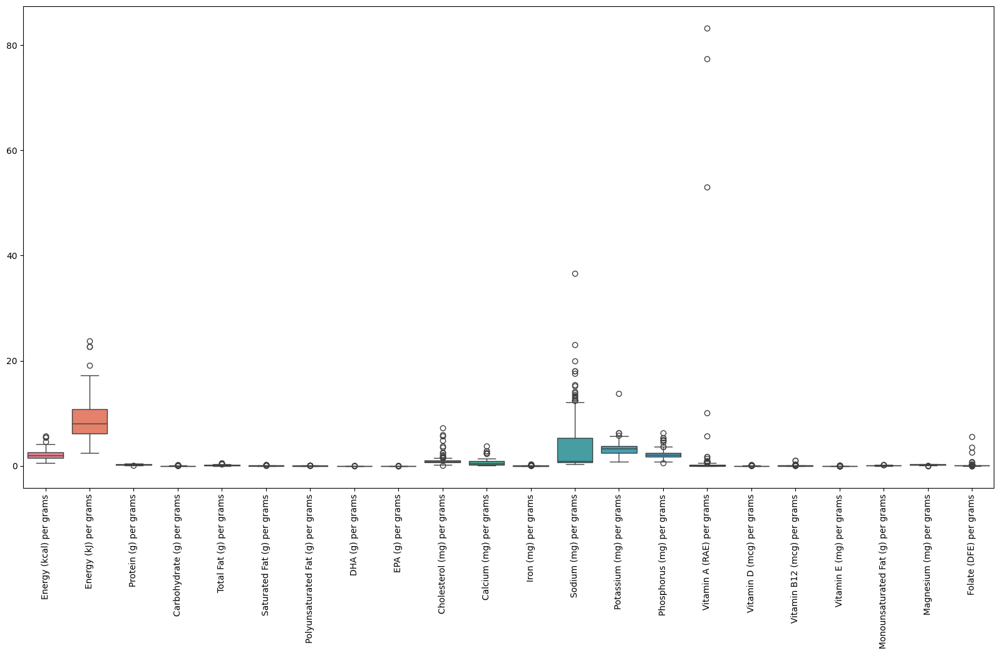

In [36]:
plt.figure(figsize=(20,10))
sns.boxplot(df_total.drop("Label",axis=1).iloc[:,3:])
plt.xticks(rotation=90)
plt.show()

#### Individual boxplot for close look

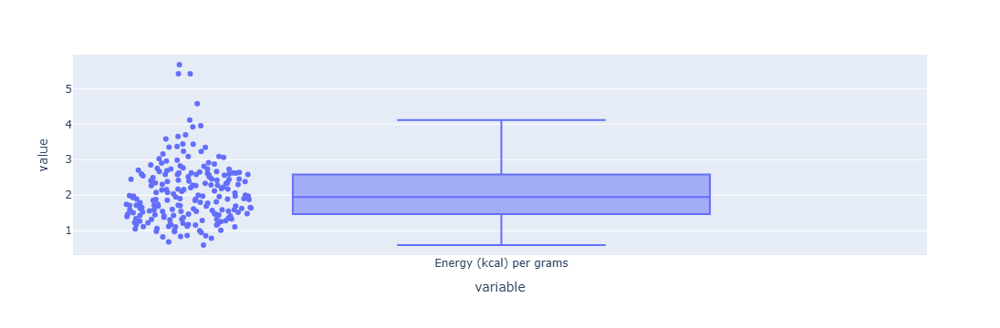

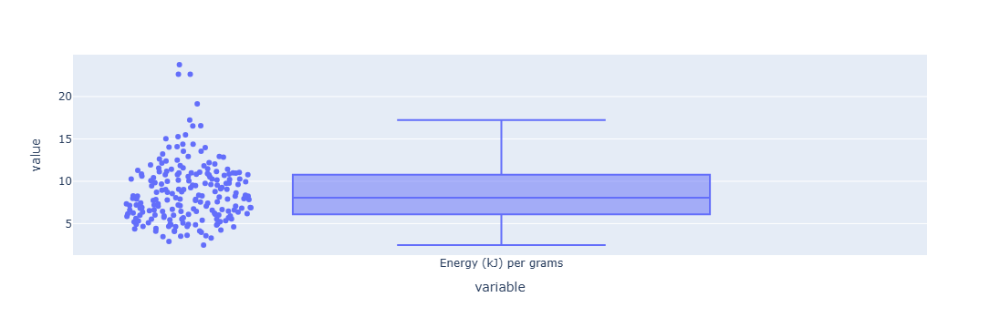

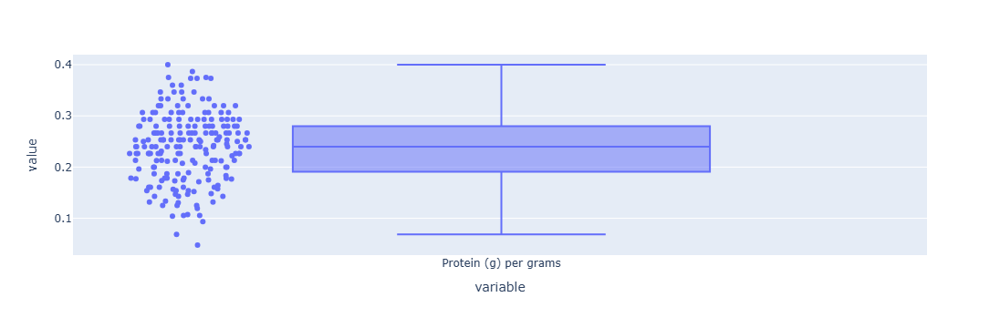

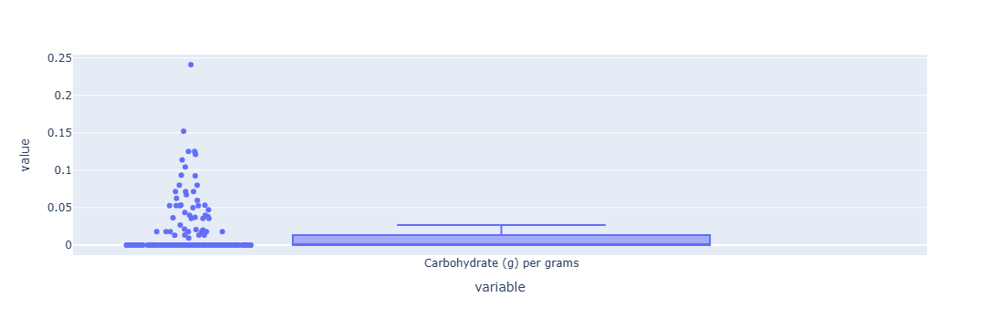

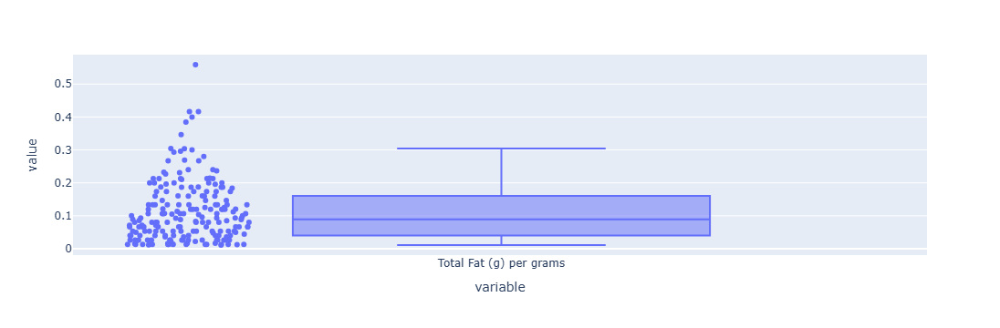

...

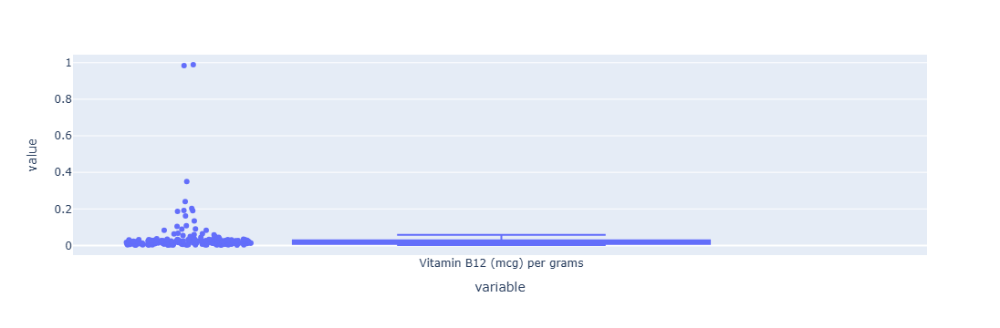

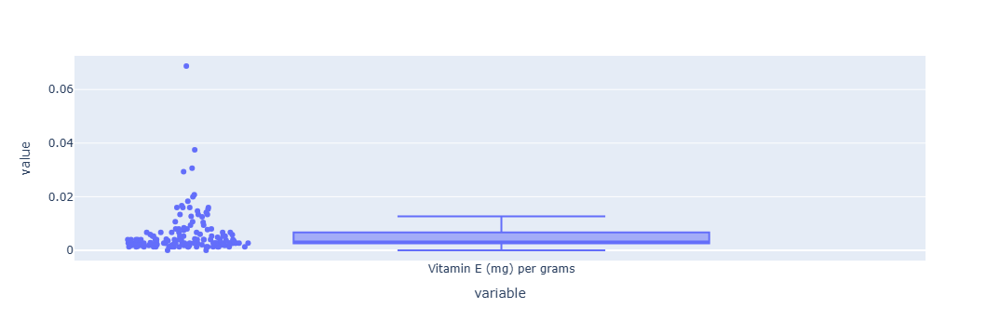

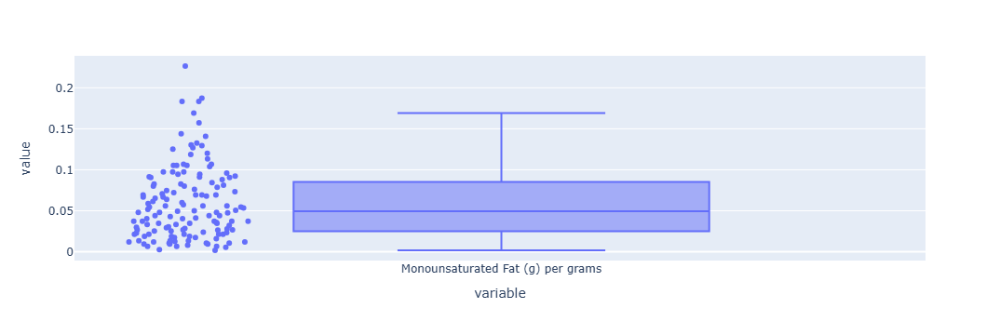

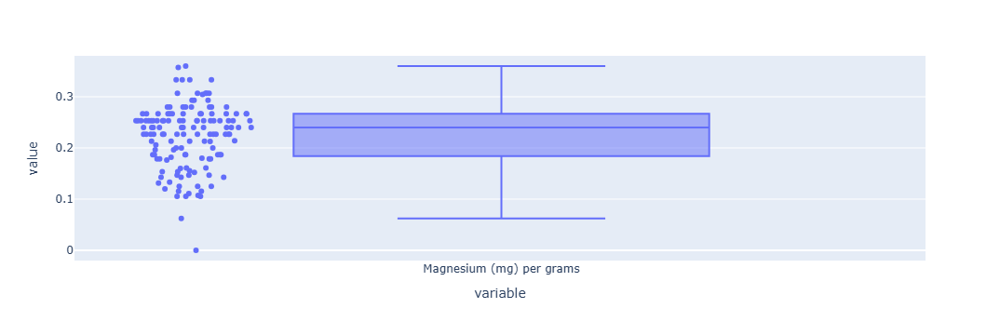

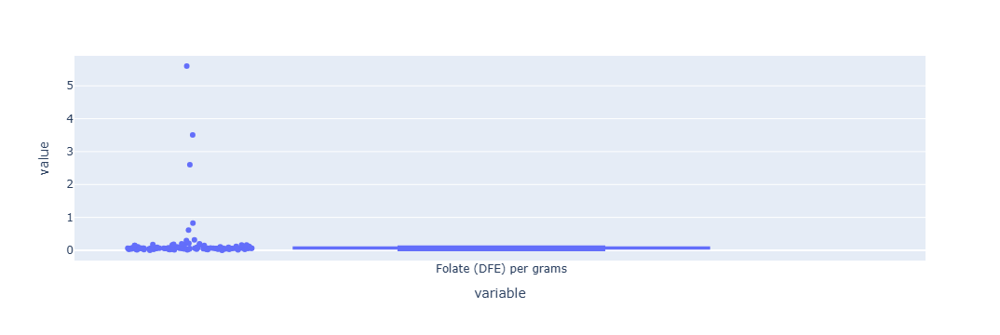

In [37]:
for col in df_total.drop("Label",axis=1).iloc[:,3:].columns.tolist():
    fig = px.box(df_total[col],points="all")
    fig.show()

#### Takeawys
<ul>
    <li>The plot shows many outliers for each feature. And with many are right skewed.</li>
</ul>


##### Pearson's Correlations

In [38]:
a=df_total.drop("Label",axis=1).iloc[:,3:].corr()
a

,Energy (kcal) per grams,Energy (kJ) per grams,Protein (g) per grams,Carbohydrate (g) per grams,Total Fat (g) per grams,Saturated Fat (g) per grams,Polyunsaturated Fat (g) per grams,DHA (g) per grams,EPA (g) per grams,Cholesterol (mg) per grams,...,Sodium (mg) per grams,Potassium (mg) per grams,Phosphorus (mg) per grams,Vitamin A (RAE) per grams,Vitamin D (mcg) per grams,Vitamin B12 (mcg) per grams,Vitamin E (mg) per grams,Monounsaturated Fat (g) per grams,Magnesium (mg) per grams,Folate (DFE) per grams
Energy (kcal) per grams,1.000000,0.999954,0.158224,0.089186,0.947713,0.918450,0.514322,0.437266,0.427144,0.062465,...,0.106589,0.034419,-0.015105,0.049380,-0.156247,-0.118704,-0.140473,0.941265,-0.051443,-0.113871
Energy (kJ) per grams,0.999954,1.000000,0.157220,0.089851,0.947943,0.919149,0.513428,0.435504,0.425726,0.062044,...,0.105434,0.034248,-0.015913,0.049351,-0.156309,-0.118800,-0.142274,0.941871,-0.052432,-0.113594
Protein (g) per grams,0.158224,0.157220,1.000000,-0.504711,-0.131478,-0.089870,-0.213188,0.278511,0.222568,0.139391,...,-0.424768,0.290230,0.374070,-0.050578,-0.064072,-0.017834,-0.042351,-0.281584,0.696718,0.031393
Carbohydrate (g) per grams,0.089186,0.089851,-0.504711,1.000000,0.113624,0.029297,0.313597,-0.088506,-0.043464,0.066812,...,0.293753,0.040709,-0.068506,0.106116,-0.080478,0.155412,0.058559,0.219439,-0.272222,0.133980
Total Fat (g) per grams,0.947713,0.947943,-0.131478,0.113624,1.000000,0.961744,0.565612,0.572241,0.596626,0.019578,...,0.245462,-0.072431,-0.140649,0.057172,-0.130210,-0.142794,-0.092182,0.984208,-0.248202,-0.126024
Saturated Fat (g) per grams,0.918450,0.919149,-0.089870,0.029297,0.961744,1.000000,0.399474,0.607353,0.617394,-0.012573,...,0.154301,-0.102921,-0.195519,0.044528,-0.174270,-0.147732,-0.222209,0.967062,-0.226729,-0.134432
Polyunsaturated Fat (g) per grams,0.514322,0.513428,-0.213188,0.313597,0.565612,0.399474,1.000000,0.648068,0.633229,0.159279,...,0.234360,-0.043453,0.085096,0.034047,0.128278,-0.025104,0.380348,0.615261,-0.189966,-0.040244
DHA (g) per grams,0.437266,0.435504,0.278511,-0.088506,0.572241,0.607353,0.648068,1.000000,0.952346,0.688864,...,0.302030,0.040419,0.367756,0.722901,0.199718,0.036851,0.817649,NaN,NaN,NaN
EPA (g) per grams,0.427144,0.425726,0.222568,-0.043464,0.596626,0.617394,0.633229,0.952346,1.000000,0.746301,...,0.361746,-0.032994,0.330709,0.785038,0.114375,0.094261,0.829255,NaN,NaN,NaN
Cholesterol (mg) per grams,0.062465,0.062044,0.139391,0.066812,0.019578,-0.012573,0.159279,0.688864,0.746301,1.000000,...,-0.078505,-0.079422,0.416142,0.406993,-0.039116,0.058480,0.259805,-0.163688,-0.017563,0.744546


#### Heatmap on the correlation values .

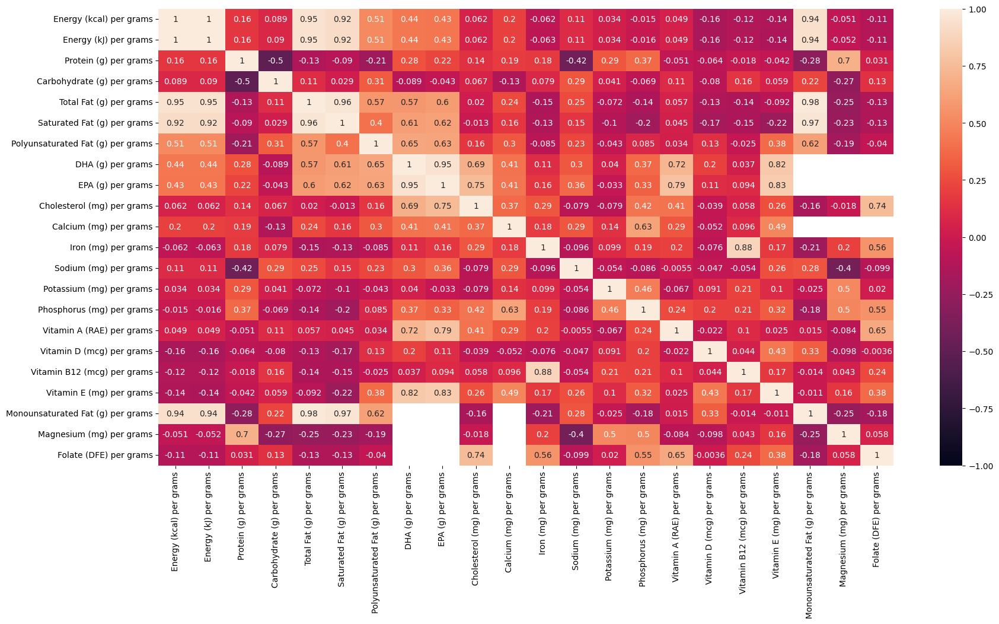

In [39]:
plt.figure(figsize=(20,10))
sns.heatmap(a,annot=True,vmin=-1,vmax=1)
plt.show()

<h3>Takeaways</h3>
<ul>
    <li>Fats and Calories tend to present together.</li>
    <li>Magnesiums and proteins can be accessed through a limited number of food source together.</li>
    <li>Food with DHA and EPA tends to have fats and cholestrols.</li>
    <li>Food with Proteins are lack of fats and sodium.</li>
    <li>Vitamins tend to spread out across multiple food scources.</li>
</ul>

##### Scatter plot for correlated features

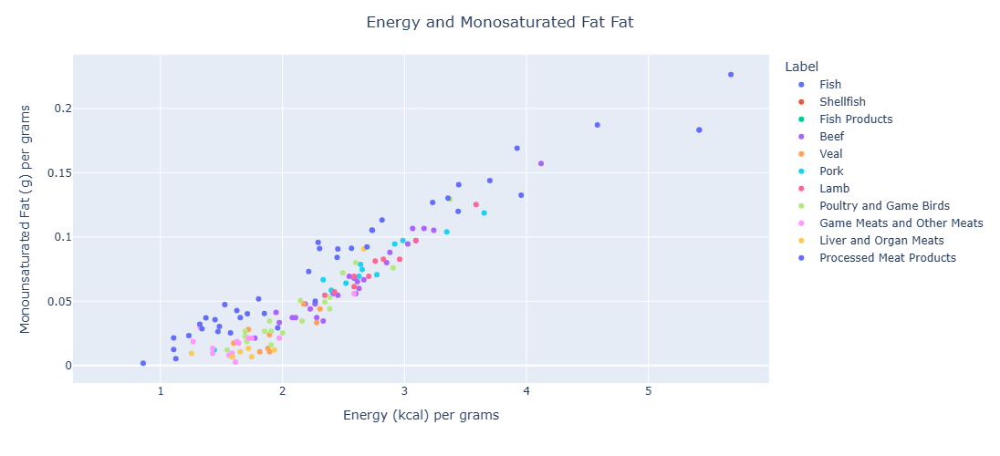

In [40]:
# Energy (kcal) vs Monounsaturated Fat
fig=px.scatter(df_total,x="Energy (kcal) per grams",y='Monounsaturated Fat (g) per grams',color="Label")
fig.update_layout(width=800,height=500,title=dict(text="Energy and Monosaturated Fat Fat",x=0.5))
fig.show()


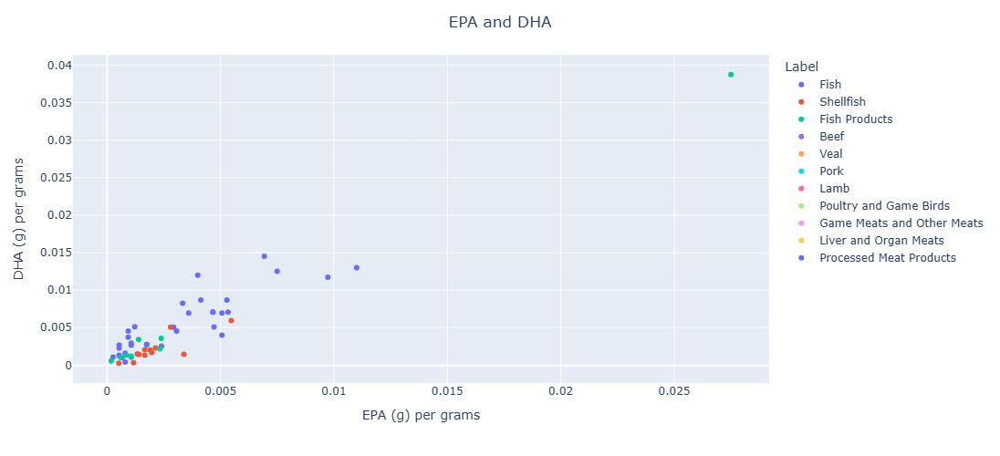

In [41]:
## EPA DHA
fig=px.scatter(df_total,x="EPA (g) per grams",y='DHA (g) per grams',color="Label")
fig.update_layout(width=800,height=500,title=dict(text="EPA and DHA",x=0.5))
fig.show()

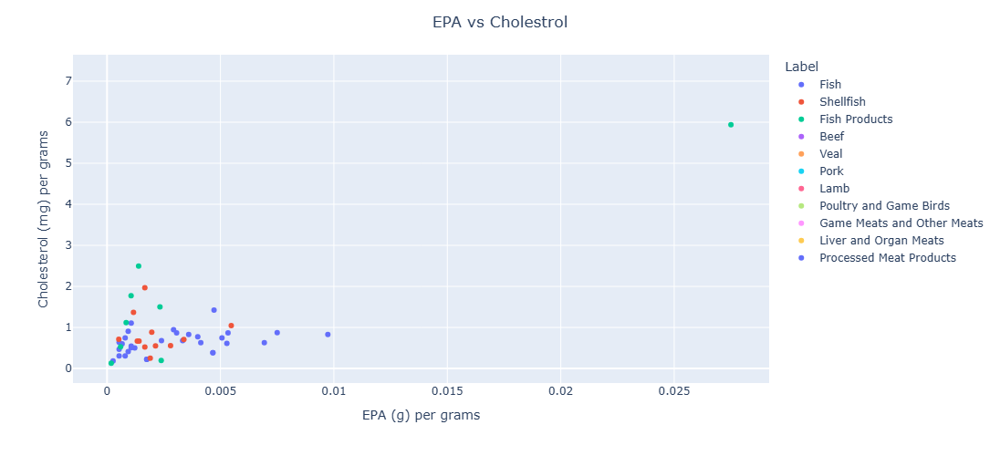

In [42]:
# cholesterol vs epa
fig=px.scatter(df_total,x="EPA (g) per grams",y='Cholesterol (mg) per grams',color="Label")
fig.update_layout(width=800,height=500,title=dict(text="EPA vs Cholestrol",x=0.5))
fig.show()

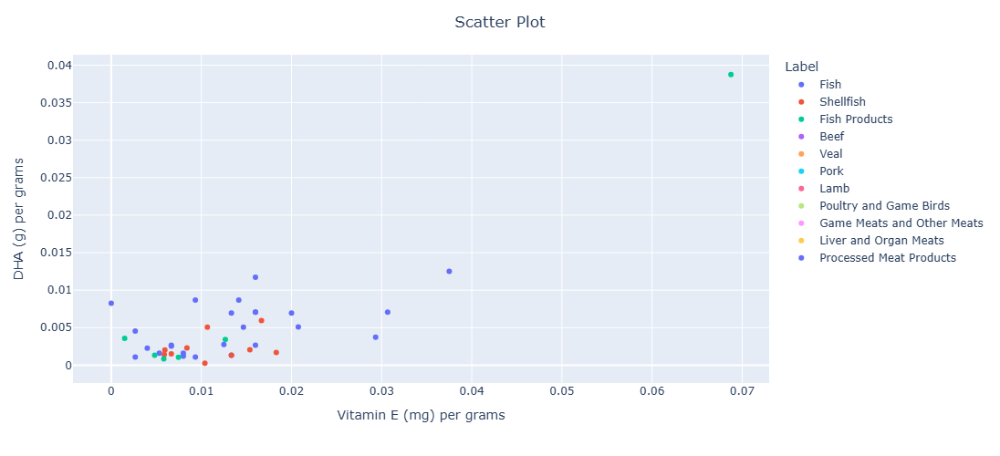

In [43]:
#calcium phosphorus
fig=px.scatter(df_total,x="Vitamin E (mg) per grams",y='DHA (g) per grams',color="Label")
fig.update_layout(width=800,height=500,title=dict(text="Scatter Plot",x=0.5))
fig.show()

## Check percentage of each food source for the dataset.

In [44]:
pie_chart=df_total.groupby("Label")["Food Name"].count().sort_values(ascending=False)/df_total.shape[0]
df_pie=pie_chart.reset_index().rename(columns={"Food Name":"Percentage"})
df_pie


,Label,Percentage
0,Processed Meat Products,0.206897
1,Fish,0.197044
2,Beef,0.133005
3,Poultry and Game Birds,0.108374
4,Game Meats and Other Meats,0.064039
5,Shellfish,0.059113
6,Pork,0.059113
7,Lamb,0.049261
8,Fish Products,0.044335
9,Veal,0.044335


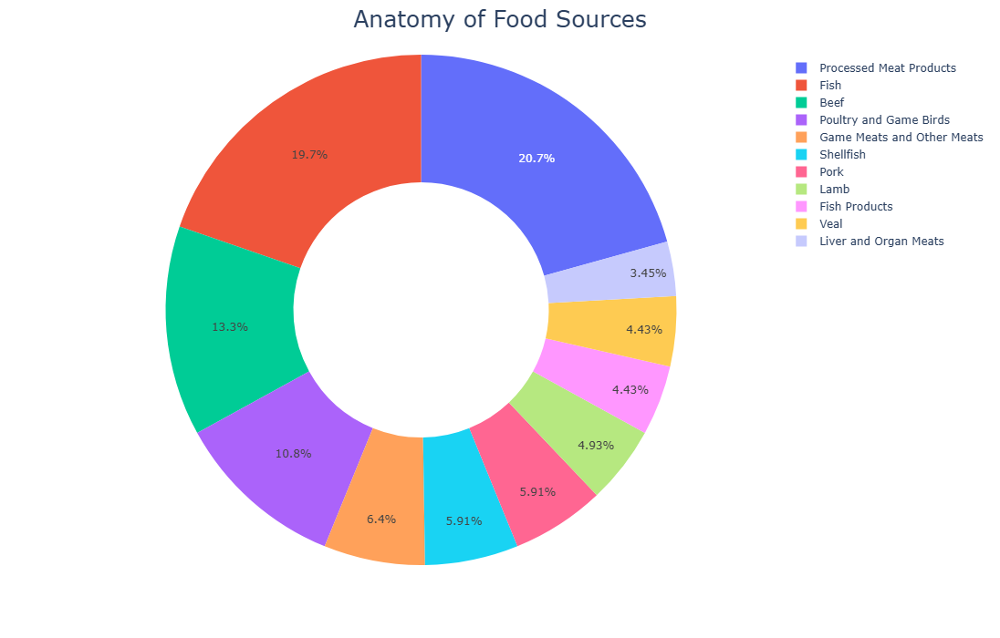

In [45]:
import plotly.express as px
fig=px.pie(df_pie,values=df_pie.Percentage,names=df_pie.Label,hole=0.5)
fig.update_layout(
    width=700,
    height=700,
    title=dict(text="Anatomy of Food Sources",font=dict(size=25),x=0.5)
)
fig.show()

## Step 3. Perform EDA. 
### To understand the top food source for healthy nutrients and the unhealthy or restrcted nutrients among them.

<h2>Brief introduction to nutrients</h2>
<h4>healthy nutrients</h4>
<ul>
    <li>Protein</li>
    <li>Polyunsaturated fats (brain function, cell growth)</li>
    <li>DHA (reduce heart disease and stroke)</li>
    <li>EPA (reduce heart disease and stroke)</li>
    <li>Calcium (strong bones)</li>
    <li>Iron (Increase immune systems)</li>
    <li>Phosphorus (good for bones and teeth)</li>
    <li>Vitamin A (Good for vision)</li>
    <li>Vitamin D (Good for bones)</li>
    <li>Vitamin b12 (red blood cell)</li>
    <li>Vitamin E (Vision and reproduction, skin, brain, and blood)</li> 
    <li>Monounsaturated fats (healthy fats)</li>
    <li>Magnesium (contain blood sugar levels)</li>
    <li>Floate DFE(good blood cell growth and function, pregnent women would need more of it)</li>
</ul>
<h4>common needed nutrients but need keep the evel from going up or even to avoid.</h4> 
<ul>
    <li>Fats</li>
    <li>Cholesterol (a medium level needed to keep healthy)</li>
    <li>Sodium</li>
    <li>Potassium</li>
</ul>
<h4>Unhealthy nutrients to avoid</h4>
<ul>
    <li>Saturated Fats</li>
    <li>Carbohydrates (sugar,starsh, cellulose)</li>
    
</ul>

## Question 1. What are the top 10 food source for proteins? And How about the unhealthy nutrients?

13         Inside (top) round steak, lean + fat, braised
15     Outside (bottom) round steak, lean + fat, braised
102    Bacon, pork, broiled, pan-fried or roasted, re...
101           Bacon, pork, broiled, pan-fried or roasted
22                          Stewing beef, lean, simmered
6                Eye of round steak, lean + fat, braised
29                          Cutlets, milk-fed, pan-fried
28                         Cutlets, grain-fed, pan-fried
4                   Cross rib roast, lean + fat, braised
0                       Blade roast, lean + fat, braised
Name: Food Name, dtype: object


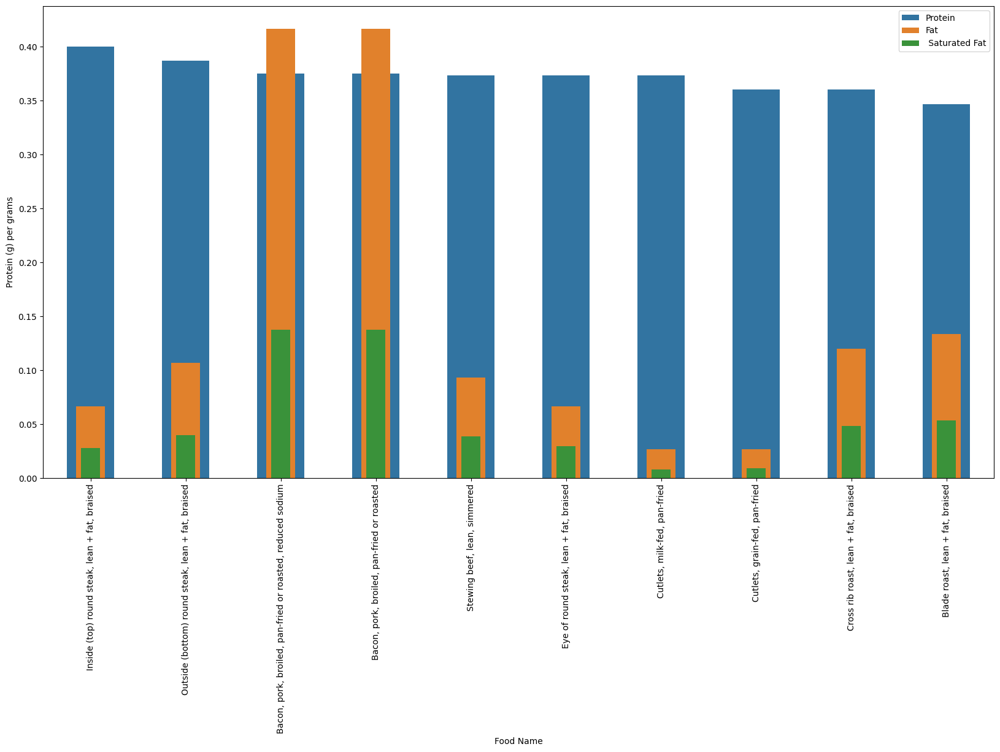

In [46]:
a=df_total.sort_values("Protein (g) per grams",ascending=False).iloc[:10]
print(a["Food Name"])
plt.figure(figsize=(20,10))
sns.barplot(x=a["Food Name"],y=a["Protein (g) per grams"],width=0.5,label="Protein")
sns.barplot(x=a["Food Name"],y=a["Total Fat (g) per grams"],width=0.3,label="Fat")
sns.barplot(x=a["Food Name"],y=a["Saturated Fat (g) per grams"],width=0.2,label=" Saturated Fat")
plt.xticks(rotation=90)
plt.legend()
plt.show()

#### Sodium number for the top 10 proteins

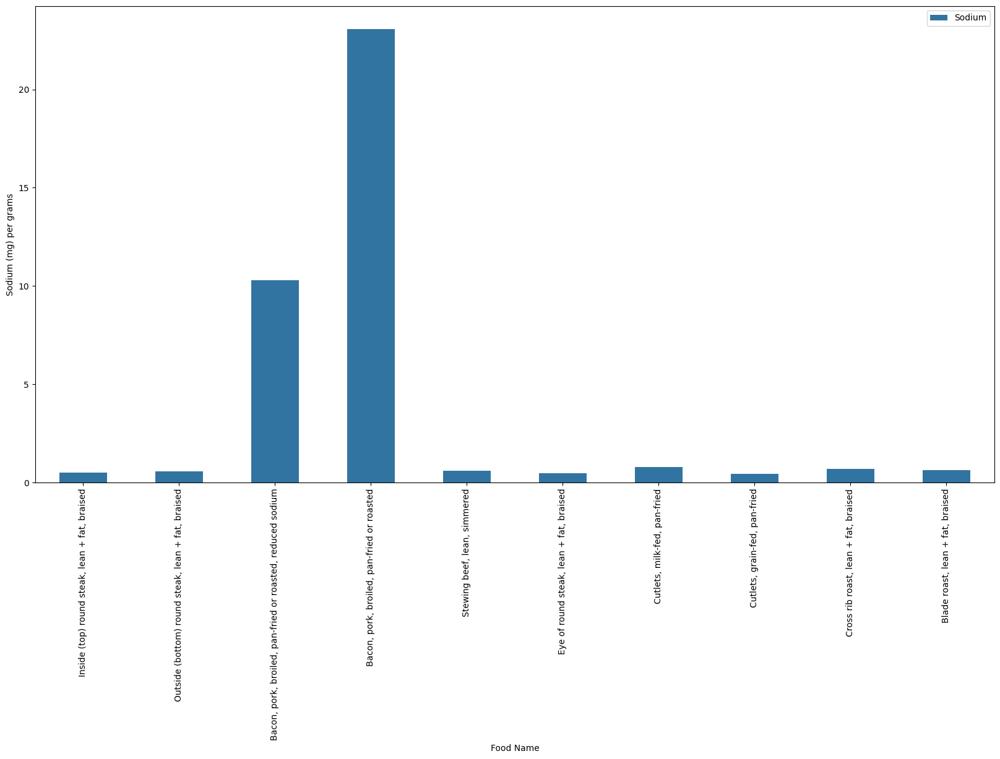

In [47]:
plt.figure(figsize=(20,10))
sns.barplot(data=a,x="Food Name",y="Sodium (mg) per grams",width=0.5,label="Sodium")
plt.xticks(rotation=90)
plt.show()

#### Check the calories out of the top 10.

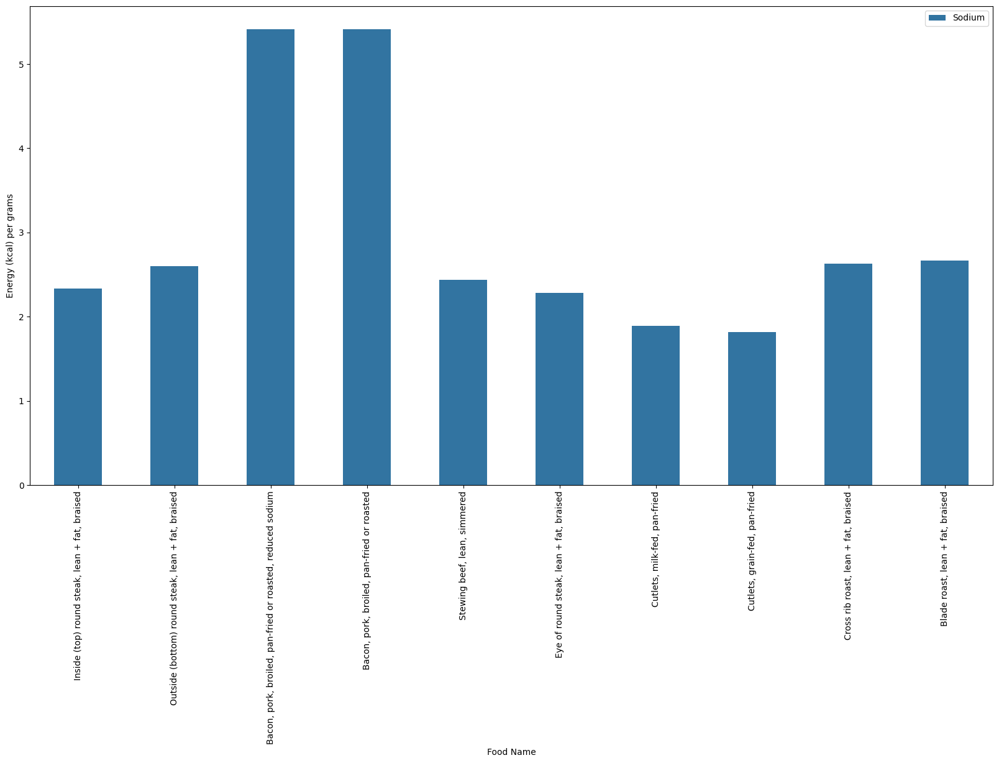

In [48]:
plt.figure(figsize=(20,10))
sns.barplot(data=a,x="Food Name",y="Energy (kcal) per grams",width=0.5,label="Sodium")
plt.xticks(rotation=90)
plt.show()

## Question 2. what are top 10 Food with Iron and Calcium calories?

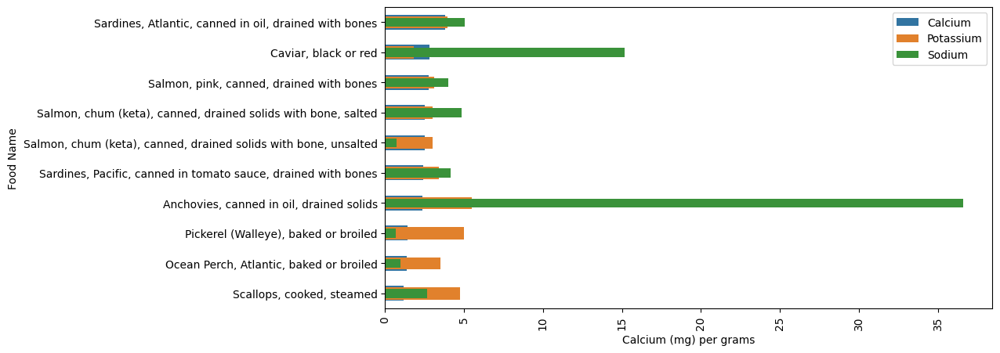

In [49]:
aa=df_total.sort_values('Calcium (mg) per grams',ascending=False).iloc[:10]
plt.figure(figsize=(10,5))
sns.barplot(data=aa,y="Food Name",x="Calcium (mg) per grams",width=0.5,label="Calcium")
sns.barplot(data=aa,y="Food Name",x="Potassium (mg) per grams",width=0.4,label="Potassium")
sns.barplot(data=aa,y="Food Name",x="Sodium (mg) per grams",width=0.3,label="Sodium")
plt.xticks(rotation=90)
plt.show()

#### Top Food containning Iron

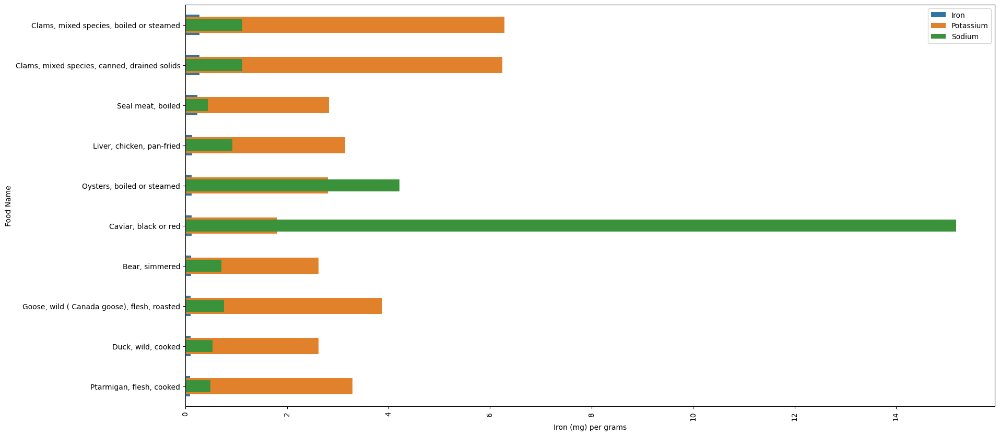

In [50]:
aa=df_total.sort_values('Iron (mg) per grams',ascending=False).iloc[:10]
plt.figure(figsize=(20,10))
sns.barplot(data=aa,y="Food Name",x="Iron (mg) per grams",width=0.5,label="Iron")
sns.barplot(data=aa,y="Food Name",x="Potassium (mg) per grams",width=0.4,label="Potassium")
sns.barplot(data=aa,y="Food Name",x="Sodium (mg) per grams",width=0.3,label="Sodium")
plt.xticks(rotation=90)
plt.show()

## Question 3. What are top 10 food with vitamin A (RAE)?

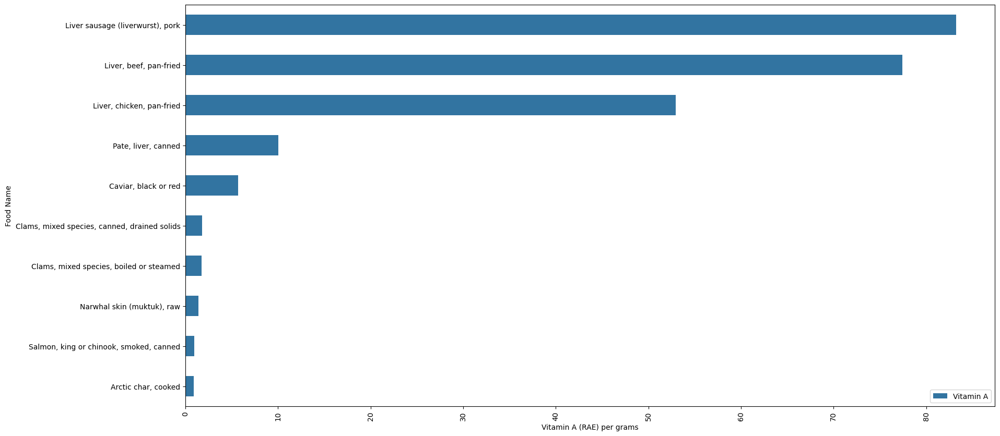

In [51]:
a3=df_total.sort_values("Vitamin A (RAE) per grams",ascending=False).iloc[:10]
plt.figure(figsize=(20,10))
sns.barplot(data=a3,y="Food Name",x="Vitamin A (RAE) per grams",width=0.5,label="Vitamin A")
plt.xticks(rotation=90)
plt.show()

#### Check top 10 Vitamine A food with unhealthy or contained nutrients

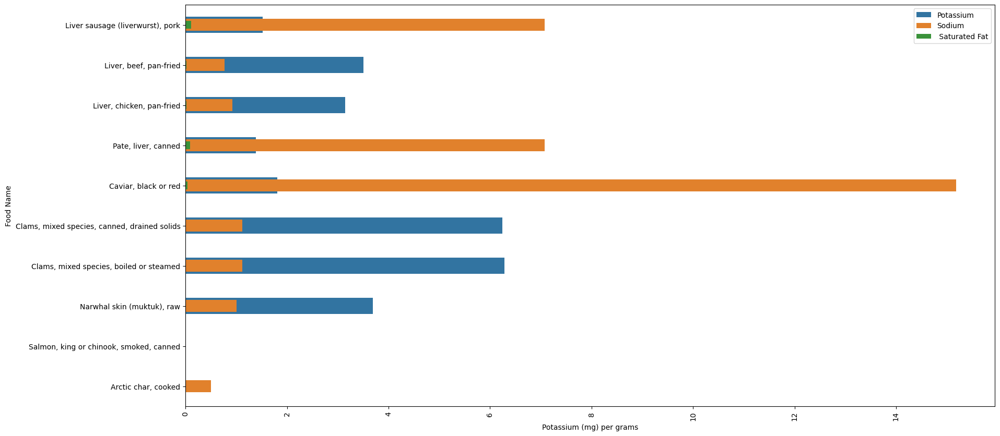

In [52]:
plt.figure(figsize=(20,10))
sns.barplot(data=a3,y="Food Name",x="Potassium (mg) per grams",width=0.4,label="Potassium")
sns.barplot(data=a3,y="Food Name",x="Sodium (mg) per grams",width=0.3,label="Sodium")
sns.barplot(data=a3,y="Food Name",x="Saturated Fat (g) per grams",width=0.2,label=" Saturated Fat")
plt.xticks(rotation=90)
plt.show()

## Question 4. What's the top 10 food rich in Saturated fat (unhealthy fat)?

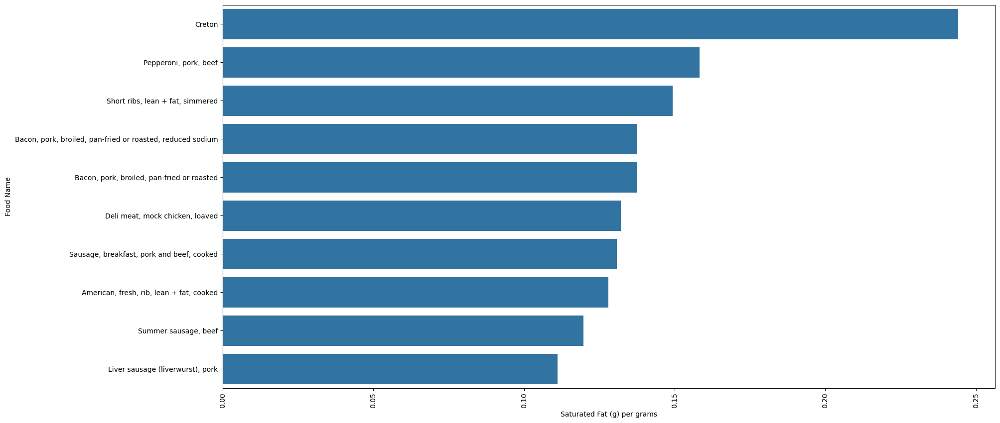

In [53]:
a4=df_total.sort_values("Saturated Fat (g) per grams", ascending=False).iloc[:10]
plt.figure(figsize=(20,10))
sns.barplot(data=a4,y="Food Name",x="Saturated Fat (g) per grams")
plt.xticks(rotation=90)
plt.show()

#### Takeaways
<ul>
    <li>Most food with the most of saturated fats are also packed food. </li>
</ul>

## Questions 5. Which categories have the highest average proteins, calciums, and Magnesium?

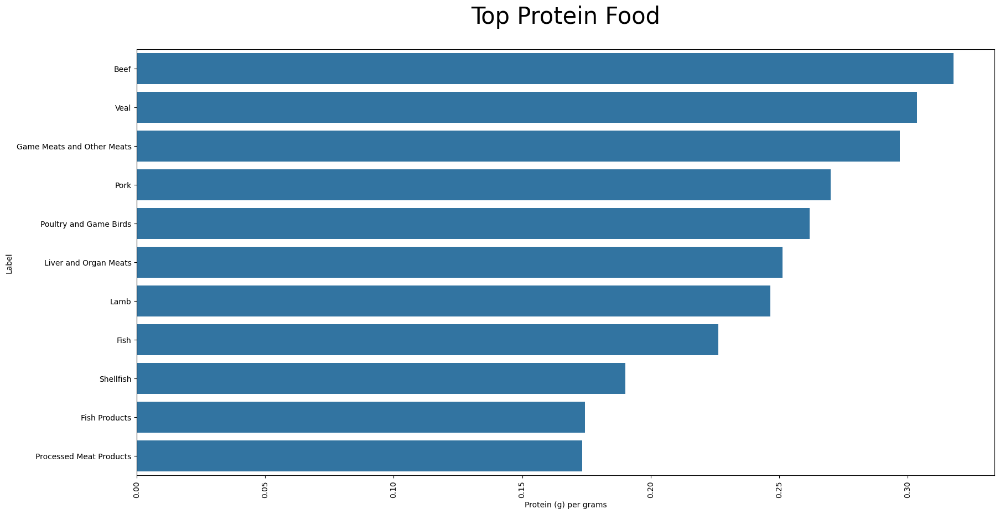

In [54]:
a5_protein=df_total.groupby("Label")["Protein (g) per grams"].mean().sort_values(ascending=False).reset_index()
plt.figure(figsize=(20,10))
sns.barplot(data=a5_protein,y="Label",x="Protein (g) per grams")
plt.xticks(rotation=90)
plt.title("Top Protein Food",size=30,y=1.05)
plt.show()

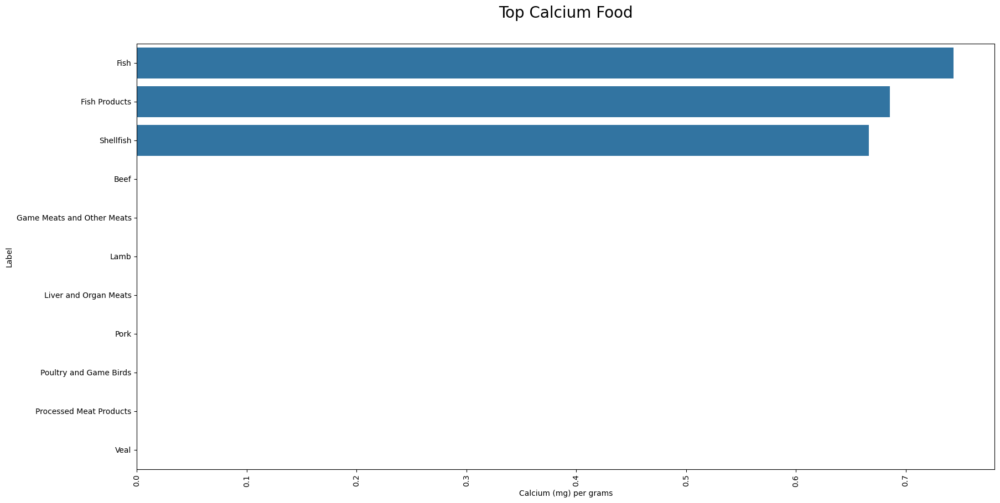

In [55]:
a5_cal=df_total.groupby("Label")["Calcium (mg) per grams"].mean().sort_values(ascending=False).reset_index()
plt.figure(figsize=(20,10))
sns.barplot(data=a5_cal,y="Label",x="Calcium (mg) per grams")
plt.xticks(rotation=90)
plt.title("Top Calcium Food",y=1.05,size=20)
plt.show()

### Takways
<ul>
    <li>Only seafood are confirmed to contain calciums among the selected anmial fats. </li>
</ul>

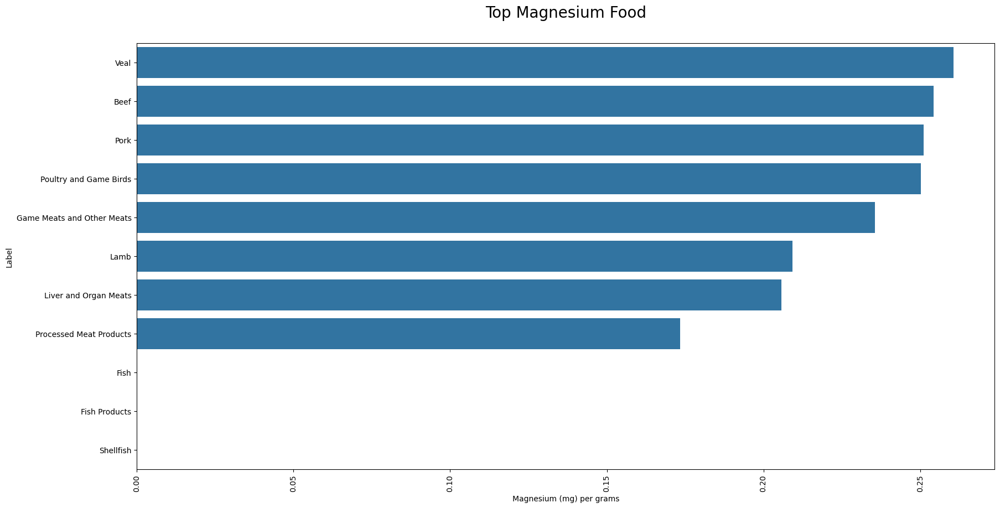

In [56]:
a5_M=df_total.groupby("Label")["Magnesium (mg) per grams"].mean().sort_values(ascending=False).reset_index()
plt.figure(figsize=(20,10))
sns.barplot(data=a5_M,y="Label",x="Magnesium (mg) per grams")
plt.xticks(rotation=90)
plt.title("Top Magnesium Food",y=1.05,size=20)
plt.show()

#### Takeawys
<ul>
    <li>Fish don't have Magnesiums. Only land animals and birds have them. They are in rich of it.</li>
</ul>

## Question 6. What are top 10 food with calories?

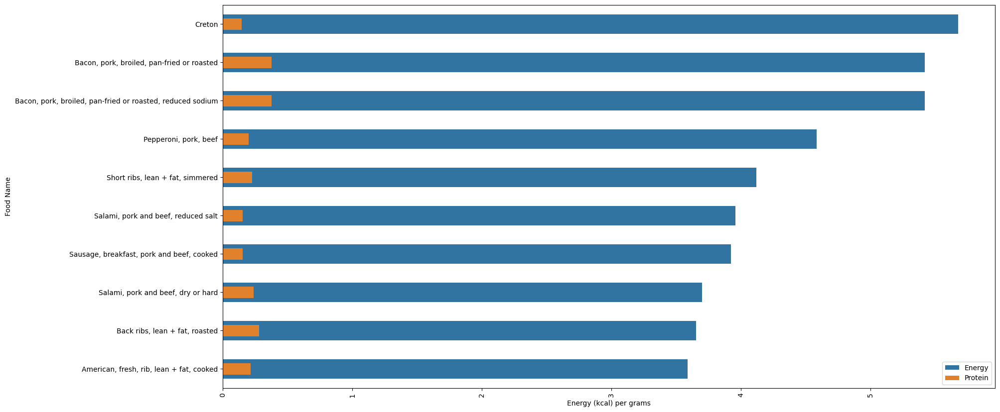

In [57]:
ac=df_total.sort_values("Energy (kcal) per grams",ascending=False).iloc[:10]
plt.figure(figsize=(20,10))
sns.barplot(data=ac,x="Energy (kcal) per grams", y="Food Name",width=0.5,label="Energy")
sns.barplot(data=ac,x="Protein (g) per grams",y="Food Name",width=0.3,label="Protein")
plt.xticks(rotation=90)
plt.legend()
plt.show()

#### Takeaway
<li>Packaged food tends to have high calories.</li>
<li>They also have lots of saturated fats(unhealthy fats).</li>

## Question 7. What are top 10 food with Carbohydrate (sugar, unhealthy nutrients)?

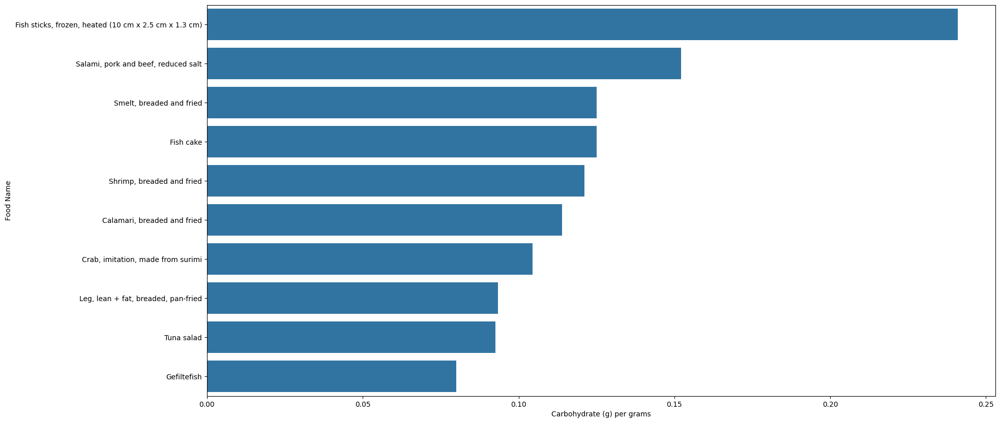

In [58]:
a7=df_total.sort_values("Carbohydrate (g) per grams",ascending=False).iloc[:10]
plt.figure(figsize=(20,10))
sns.barplot(data=a7,x="Carbohydrate (g) per grams", y="Food Name")
plt.show()

#### Takeawys
<li>Breaded and fried food tends to have high in carbohydrate.</li>

### End of EDA

## Part 4. Model Building Section.

<h4>Model Building Steps</h4>
<ol>
    <li>Apply cluster algorithms to cluster datasets into several groups in terms of nutrients. Then Attach labels into each data point.</li>
    <li>Apply a number of classification algorithms to train the data.</li>
    <li>Make predictions with datas from StatsCan.</li>
</ol>

#### Feature Selections.

#### Get the intersection of the fish and meat columns.

<Axes: >

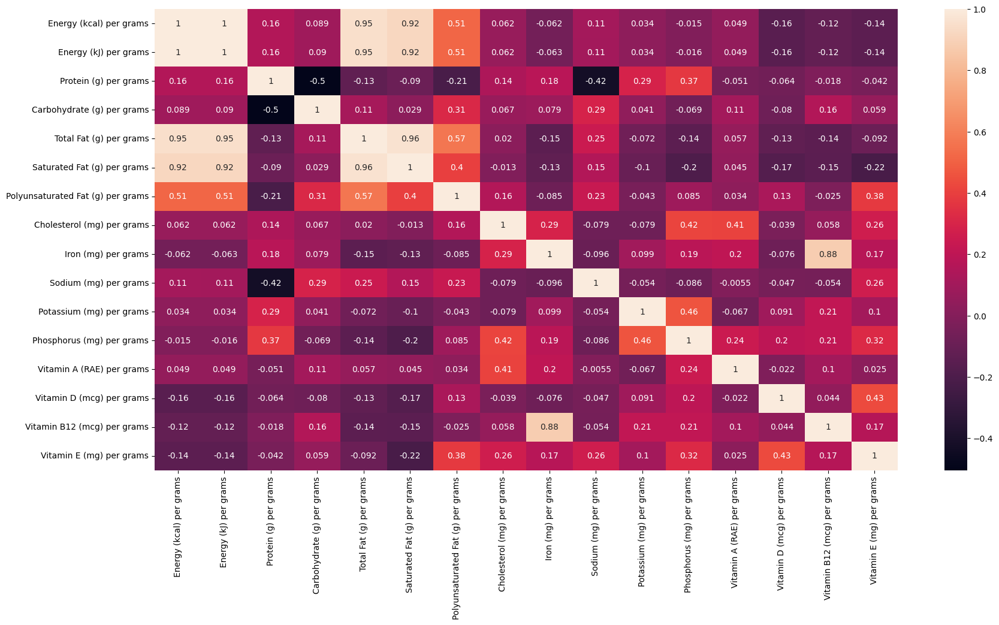

In [59]:
l1=df_meat1.columns
l2=df_fish1.columns
intersection_features=[f for f in l1 if f in l2]
lst_features=[
    'Energy (kcal) per grams',
 'Energy (kJ) per grams',
 'Protein (g) per grams',
 'Carbohydrate (g) per grams',
 'Total Fat (g) per grams',
 'Saturated Fat (g) per grams',
 'Polyunsaturated Fat (g) per grams',
 'Cholesterol (mg) per grams',
 'Iron (mg) per grams',
 'Sodium (mg) per grams',
 'Potassium (mg) per grams',
 'Phosphorus (mg) per grams',
 'Vitamin A (RAE) per grams',
 'Vitamin D (mcg) per grams',
 'Vitamin B12 (mcg) per grams',
 'Vitamin E (mg) per grams'
]
plt.figure(figsize=(20,10))
sns.heatmap(df_total[lst_features].corr(),annot=True)

<Axes: >

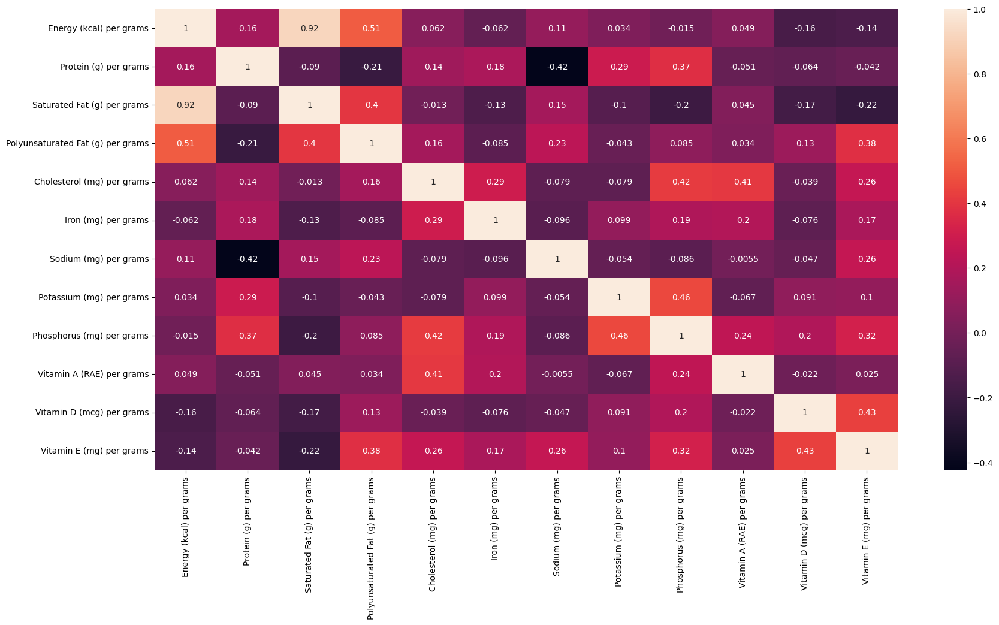

In [60]:
#### Reduce multicolinearity by removing Energy (kj), total fat, vitamin b12,
lst_features=[
    'Energy (kcal) per grams',
 #'Energy (kJ) per grams',
 'Protein (g) per grams',
 #'Carbohydrate (g) per grams',
 #'Total Fat (g) per grams',
 'Saturated Fat (g) per grams',
 'Polyunsaturated Fat (g) per grams',
 'Cholesterol (mg) per grams',
 'Iron (mg) per grams',
 'Sodium (mg) per grams',
 'Potassium (mg) per grams',
 'Phosphorus (mg) per grams',
 'Vitamin A (RAE) per grams',
 'Vitamin D (mcg) per grams',
 #'Vitamin B12 (mcg) per grams',
 'Vitamin E (mg) per grams'
]
plt.figure(figsize=(20,10))
sns.heatmap(df_total[lst_features].corr(),annot=True)

In [61]:
# Give the data a good shuffle to reduce the biasness since they are already grouped.
data=df_total.sample(frac=1,random_state=42)
data.reset_index(drop=True,inplace=True)
data.head()

,Food Name,Measure,Weight (g),Energy (kcal) per grams,Energy (kJ) per grams,Protein (g) per grams,Carbohydrate (g) per grams,Total Fat (g) per grams,Saturated Fat (g) per grams,Polyunsaturated Fat (g) per grams,...,Potassium (mg) per grams,Phosphorus (mg) per grams,Vitamin A (RAE) per grams,Vitamin D (mcg) per grams,Vitamin B12 (mcg) per grams,Vitamin E (mg) per grams,Label,Monounsaturated Fat (g) per grams,Magnesium (mg) per grams,Folate (DFE) per grams
0,"Ocean Perch, Atlantic, baked or broiled",75 g,75,1.213333,5.066667,0.240000,0.00,0.026667,0.002667,0.005333,...,3.506667,2.773333,0.146667,NaN,0.011467,0.016000,Fish,NaN,NaN,NaN
1,Gefiltefish,75 g,75,0.840000,3.506667,0.093333,0.08,0.013333,0.004000,0.002667,...,0.906667,0.733333,0.266667,NaN,0.008400,NaN,Fish,NaN,NaN,NaN
2,"New Zealand, frozen, composite, lean + fat, co...",75g,75,2.706667,11.293333,0.253333,0.00,0.173333,0.088000,0.009333,...,1.613333,2.106667,0.000000,0.006667,0.027067,0.001333,Lamb,0.069333,0.186667,0.013333
3,"Rib steak, lean + fat, broiled",75 g,75,3.093333,12.920000,0.306667,0.00,0.200000,0.085333,0.006667,...,3.240000,2.026667,0.000000,0.006667,0.024000,0.006667,Beef,0.097333,0.253333,0.066667
4,"Eye of round roast, lean + fat, roasted",75 g,75,1.973333,8.240000,0.320000,0.00,0.066667,0.028000,0.002667,...,3.240000,2.026667,0.000000,0.006667,0.019200,0.002667,Beef,0.033333,0.253333,0.066667


In [62]:
#### Select features not correlated with each other.

# Fill null values with 0 for the purpose of this assignment.
data_features=data[lst_features].fillna(0)
data_features.isnull().sum()

Energy (kcal) per grams              0
Protein (g) per grams                0
Saturated Fat (g) per grams          0
Polyunsaturated Fat (g) per grams    0
Cholesterol (mg) per grams           0
Iron (mg) per grams                  0
Sodium (mg) per grams                0
Potassium (mg) per grams             0
Phosphorus (mg) per grams            0
Vitamin A (RAE) per grams            0
Vitamin D (mcg) per grams            0
Vitamin E (mg) per grams             0
dtype: int64

<h3>Clustering</h3>

#### Feature Scaling

In [63]:
data_features.describe()
#The numeric scale for each feature is too grand, so feature scaling is needed.

,Energy (kcal) per grams,Protein (g) per grams,Saturated Fat (g) per grams,Polyunsaturated Fat (g) per grams,Cholesterol (mg) per grams,Iron (mg) per grams,Sodium (mg) per grams,Potassium (mg) per grams,Phosphorus (mg) per grams,Vitamin A (RAE) per grams,Vitamin D (mcg) per grams,Vitamin E (mg) per grams
count,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000
mean,2.073261,0.239417,0.038604,0.014256,0.925656,0.026170,3.703992,3.142467,2.145102,1.272769,0.012327,0.004285
std,0.848774,0.066961,0.038257,0.012777,0.857265,0.036644,5.306671,1.307041,0.916079,8.775833,0.028135,0.007200
min,0.595238,0.047619,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.468627,0.192659,0.010667,0.004919,0.609235,0.009333,0.626667,2.433333,1.676786,0.000000,0.001333,0.000000
50%,1.946667,0.240000,0.025714,0.009333,0.813333,0.014667,0.866667,3.226667,2.053333,0.014085,0.006667,0.002667
75%,2.586667,0.280000,0.055310,0.020127,0.973333,0.028000,5.143585,3.746667,2.503333,0.207595,0.008000,0.004211
max,5.676471,0.400000,0.244118,0.075000,7.160000,0.280000,36.625000,13.717391,6.266667,83.259259,0.226667,0.068750


In [64]:
X=data_features
from sklearn.preprocessing import StandardScaler
std_kmeans=StandardScaler()
X_std=std_kmeans.fit_transform(X)

#### Apply PCA for top features

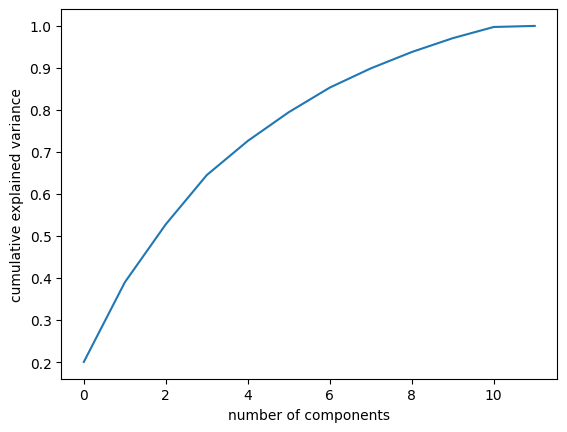

In [65]:
from sklearn.decomposition import PCA
pca=PCA().fit(X_std)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

In [66]:
# It looke the first 5 components would capture above 80% of variance.
pca=PCA(n_components=5)
X_pca=pca.fit_transform(X_std)
print("Top 5 components for clustering:", X_pca)

Top 5 components for clustering: [[-1.61585693e+00  4.15948617e-01 -7.59318870e-01 -4.72535467e-01
   1.42649252e-01]
 [-1.05930657e+00 -2.91964597e+00 -1.47881560e+00  1.64025661e+00
   4.26009981e-02]
 [ 9.17790870e-01 -4.58914867e-01  1.08989146e+00  5.01186826e-01
  -8.74368947e-01]
 ...
 [-2.14039371e-02  5.10345957e-01  1.16854825e-01 -4.46219810e-01
   1.81741677e-01]
 [-2.55199951e-01 -1.16586568e+00 -1.12097681e+00  2.30615168e-03
   1.50086428e+00]
 [ 1.36594891e-01  5.09058999e-01  1.12618711e+00 -6.33753159e-01
  -1.34535523e-01]]


In [67]:
X_pca.shape

(203, 5)

#### Performing cluster algorithm top 5 features according to PCA.

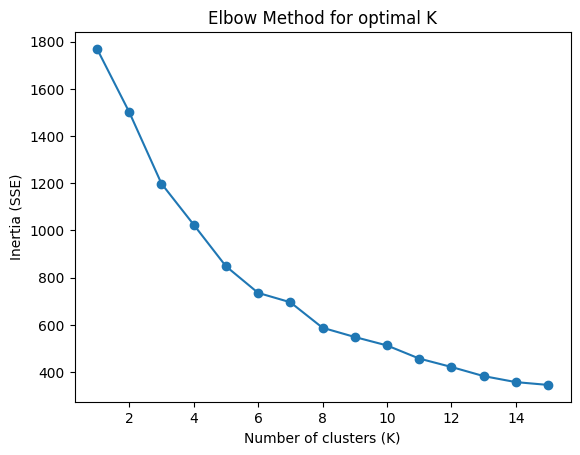

In [68]:
from sklearn.cluster import KMeans
sse=[]
for k in range(1,16):
    kmeans=KMeans(n_clusters=k,random_state=42)
    kmeans.fit(X_pca)
    sse.append(kmeans.inertia_)
plt.plot(range(1,16),sse,marker="o")    
plt.xlabel("Number of clusters (K)")
plt.ylabel("Inertia (SSE)")
plt.title("Elbow Method for optimal K")
plt.show()

#### Clearly, the optimal cluster is 3.

In [69]:
kmeans4=KMeans(n_clusters=3,random_state=42)
kmeans4.fit(X_pca)
clusters=kmeans4.labels_
data_features["Clusters"]=clusters
data_features["Label"]=data["Label"]
data_features.head()

,Energy (kcal) per grams,Protein (g) per grams,Saturated Fat (g) per grams,Polyunsaturated Fat (g) per grams,Cholesterol (mg) per grams,Iron (mg) per grams,Sodium (mg) per grams,Potassium (mg) per grams,Phosphorus (mg) per grams,Vitamin A (RAE) per grams,Vitamin D (mcg) per grams,Vitamin E (mg) per grams,Clusters,Label
0,1.213333,0.240000,0.002667,0.005333,0.546667,0.012000,0.960000,3.506667,2.773333,0.146667,0.000000,0.016000,2,Fish
1,0.840000,0.093333,0.004000,0.002667,0.306667,0.025333,5.240000,0.906667,0.733333,0.266667,0.000000,0.000000,2,Fish
2,2.706667,0.253333,0.088000,0.009333,1.066667,0.021333,0.466667,1.613333,2.106667,0.000000,0.006667,0.001333,0,Lamb
3,3.093333,0.306667,0.085333,0.006667,0.773333,0.025333,0.746667,3.240000,2.026667,0.000000,0.006667,0.006667,0,Beef
4,1.973333,0.320000,0.028000,0.002667,0.666667,0.020000,0.533333,3.240000,2.026667,0.000000,0.006667,0.002667,2,Beef


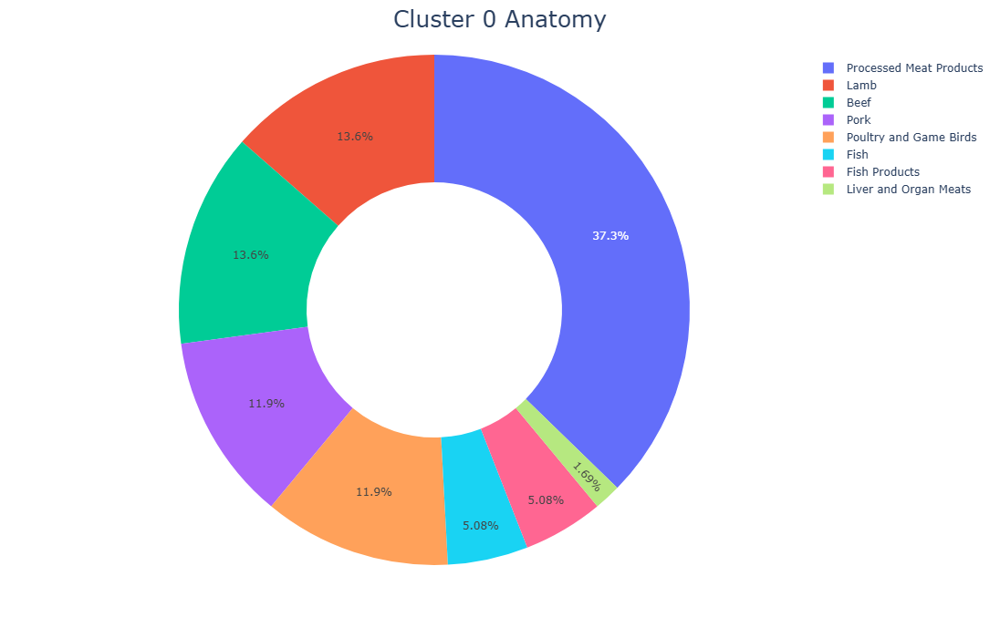

In [70]:
a0=data_features.query("Clusters==0")["Label"].value_counts().reset_index()
import plotly.express as px
fig=px.pie(a0,values="count",names="Label",hole=0.5)
fig.update_layout(
    width=700,
    height=700,
    title=dict(text="Cluster 0 Anatomy",font=dict(size=25),x=0.5)
)
fig.show()

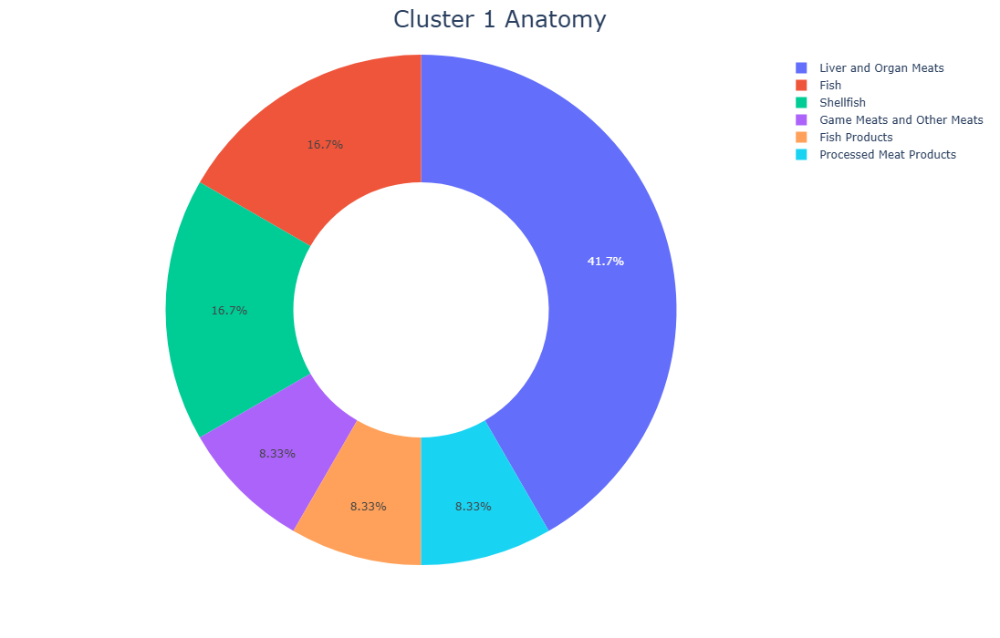

In [71]:
a1=data_features.query("Clusters==1")["Label"].value_counts().reset_index()
import plotly.express as px
fig=px.pie(a1,values="count",names="Label",hole=0.5)
fig.update_layout(
    width=700,
    height=700,
    title=dict(text="Cluster 1 Anatomy",font=dict(size=25),x=0.5)
)
fig.show()

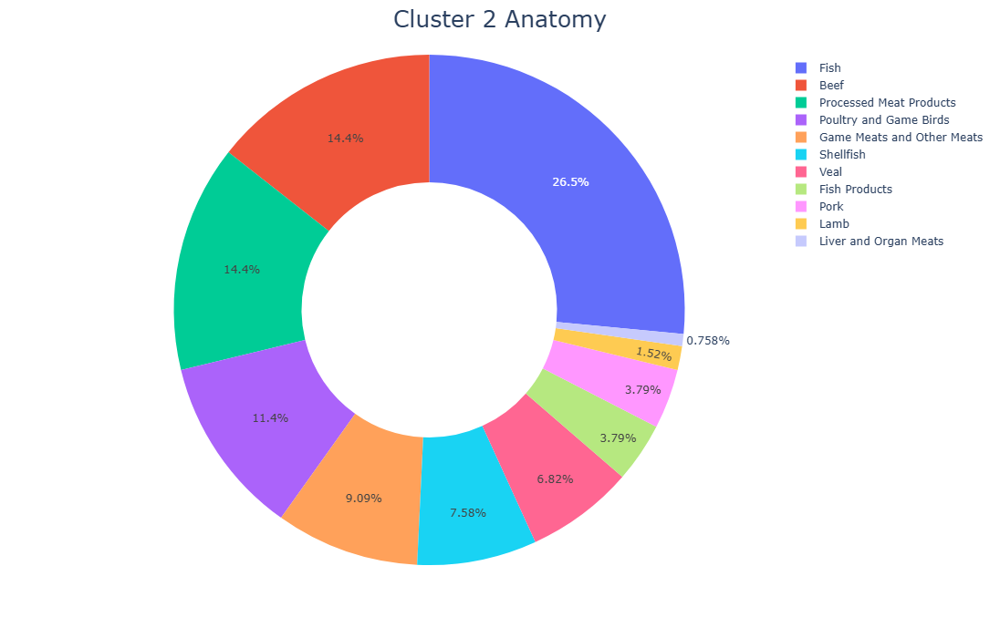

In [72]:
a2=data_features.query("Clusters==2")["Label"].value_counts().reset_index()
import plotly.express as px
fig=px.pie(a2,values="count",names="Label",hole=0.5)
fig.update_layout(
    width=700,
    height=700,
    title=dict(text="Cluster 2 Anatomy",font=dict(size=25),x=0.5)
)
fig.show()

#### Takeaways
<p>The source of food category are spread across the clusters. And The clusters weights are not balanced.<p></p>

#### Checking the mean value of each cluster.

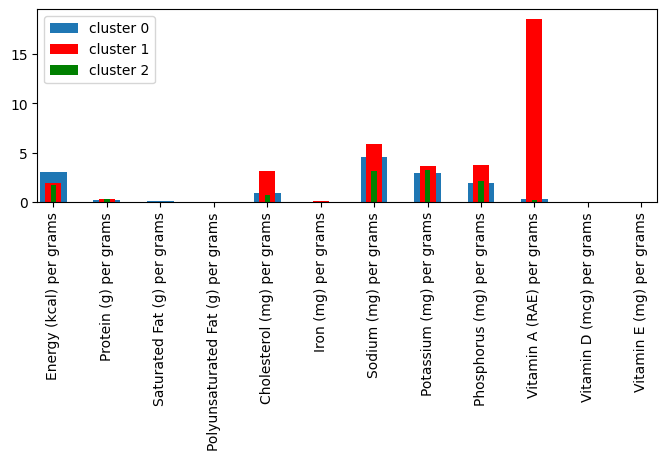

In [73]:
plt.figure(figsize=(8,2.5))
data_features.query("Clusters==0").iloc[:,:-2].mean().plot.bar(label="cluster 0")
data_features.query("Clusters==1").iloc[:,:-2].mean().plot.bar(width=0.3,color="red",label="cluster 1")
data_features.query("Clusters==2").iloc[:,:-2].mean().plot.bar(width=0.1,color="green",label="cluster 2")
plt.legend()
plt.show()

#### Takeawys
<li>Cluster 0: High In Calorie.</li>
<li>Cluster 1: High In Cholesterol. High in Vitamin A.</li>
<li>Cluster 2: Lower Level at everything comparing to its peers</li>

#### The count of each cluster.

Clusters
2    132
0     59
1     12
Name: count, dtype: int64


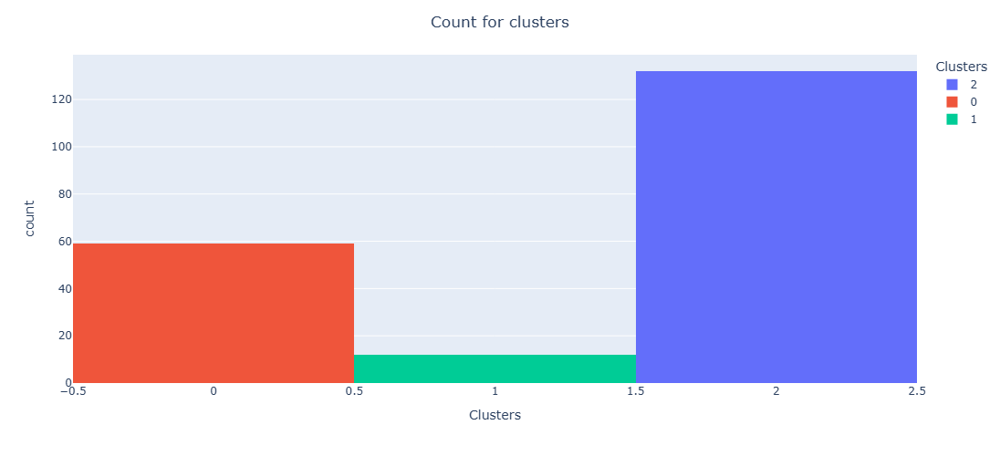

In [74]:
print(data_features["Clusters"].value_counts())
#sns.countplot(x=data_features["Clusters"],hue=data_features["Clusters"])
fig=px.histogram(data_features,x="Clusters",color="Clusters")
fig.update_layout(width=600,height=500,title={"text":"Count for clusters","x":0.5})
fig.show()

#### Feature Selections

In [75]:
# f_classif score is applied since all the columns are numeric features
from sklearn.feature_selection import SelectKBest, chi2,f_classif
X=data_features.iloc[:,:-2]
y=data_features["Clusters"]
selector=SelectKBest(score_func=f_classif,k="all")
top_features=selector.fit_transform(X,y)
names=selector.get_feature_names_out()
scores=selector.scores_
df_f=pd.DataFrame({"columns":names,"scores":scores})
#print(len(names),len(scores))
f_scores=df_f.sort_values("scores",ascending=False)
f_scores

,columns,scores
2,Saturated Fat (g) per grams,124.413558
0,Energy (kcal) per grams,102.209530
4,Cholesterol (mg) per grams,77.136395
5,Iron (mg) per grams,59.235569
3,Polyunsaturated Fat (g) per grams,43.949279
9,Vitamin A (RAE) per grams,32.762864
8,Phosphorus (mg) per grams,26.926701
11,Vitamin E (mg) per grams,13.938405
1,Protein (g) per grams,5.292795
6,Sodium (mg) per grams,2.705790


In [76]:
#### Top features
lst=f_scores["columns"].tolist()
# df_chi2.columns
data=data_features[lst]
data.head(2)

,Saturated Fat (g) per grams,Energy (kcal) per grams,Cholesterol (mg) per grams,Iron (mg) per grams,Polyunsaturated Fat (g) per grams,Vitamin A (RAE) per grams,Phosphorus (mg) per grams,Vitamin E (mg) per grams,Protein (g) per grams,Sodium (mg) per grams,Potassium (mg) per grams,Vitamin D (mcg) per grams
0,0.002667,1.213333,0.546667,0.012000,0.005333,0.146667,2.773333,0.016,0.240000,0.96,3.506667,0.0
1,0.004000,0.840000,0.306667,0.025333,0.002667,0.266667,0.733333,0.000,0.093333,5.24,0.906667,0.0


## Train the data with LogisticRegression Model

In [77]:
# Pick top 6 features for this model.
X=data.iloc[:,:6]
y=data_features["Clusters"]
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)
from sklearn.preprocessing import StandardScaler
std_log=StandardScaler()
X_train_std_log=std_log.fit_transform(X_train)
X_test_std_log=std_log.fit_transform(X_test)

#### Apply GridSearchCV to find the best parameters.

In [78]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
log_model1 = OneVsRestClassifier(LogisticRegression(solver='saga', max_iter=5000,class_weight="balanced"))
penalty = ["elasticnet"]
l1_ratio=np.linspace(0,1,11)
C = np.logspace(0, 4, 10)
# Use estimator__ to refer to LogisticRegression parameters
param_grid = {'estimator__C': C, 'estimator__penalty': penalty,"estimator__l1_ratio":l1_ratio}
# GridSearchCV
logit= GridSearchCV(log_model1, param_grid=param_grid)
logit.fit(X_train_std_log, y_train)
logit.best_params_

C:\Users\Kun\2023anaconda\envs\Data_Science\Lib\site-packages\sklearn\linear_model\_sag.py:349: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\Kun\2023anaconda\envs\Data_Science\Lib\site-packages\sklearn\linear_model\_sag.py:349: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



{'estimator__C': np.float64(7.742636826811269),
 'estimator__l1_ratio': np.float64(0.0),
 'estimator__penalty': 'elasticnet'}

#### Model Performance

confusion matrix is 
[[12  1  0]
 [ 0  0  1]
 [ 0  0 27]]
train accuracy is 0.9691358024691358, test accuracy is 0.9512195121951219
              precision    recall  f1-score   support

           0       0.92      1.00      0.96        12
           1       0.00      0.00      0.00         1
           2       1.00      0.96      0.98        28

    accuracy                           0.95        41
   macro avg       0.64      0.65      0.65        41
weighted avg       0.95      0.95      0.95        41



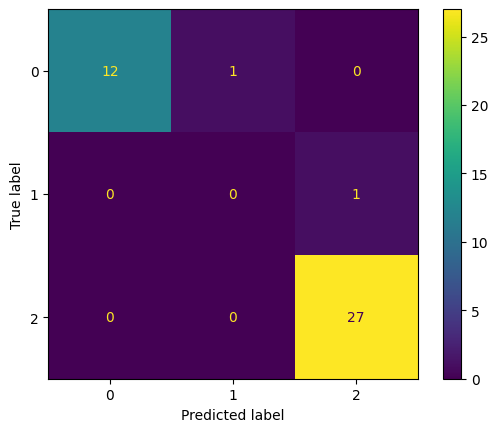

In [79]:
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report,ConfusionMatrixDisplay
y_test_pred=logit.predict(X_test_std_log)
y_train_pred=logit.predict(X_train_std_log)
cm=confusion_matrix(y_test,y_test_pred)
test_accuracy=accuracy_score(y_test_pred,y_test)
train_accuracy=accuracy_score(y_train_pred,y_train)
print(f"confusion matrix is \n{cm}")
print(f"train accuracy is {train_accuracy}, test accuracy is {test_accuracy}")
print(classification_report(y_test_pred,y_test))
disp=ConfusionMatrixDisplay(cm,display_labels=logit.classes_)
disp.plot()
plt.show()

In [80]:
null_accuracy_lr=27/(27+1+13)
null_accuracy_lr

0.6585365853658537

## Takeaways
<li>Model is well fitted, and it has a very good accuracy.</li>
<li>Both scores above null accuracy.</li>

## Trainning the model with Decision Trees Model

In [81]:
X_dt=data.iloc[:,:1]
y_dt=data_features.Clusters
X_train_dt,X_test_dt,y_train_dt,y_test_dt=train_test_split(X_dt,y_dt,test_size=0.2,random_state=42)
from sklearn.preprocessing import StandardScaler
std_dt=StandardScaler()
X_train_dt_std=std_dt.fit_transform(X_train_dt)
X_test_dt_std=std_dt.transform(X_test_dt)

In [82]:
from sklearn.tree import DecisionTreeClassifier
clf1=DecisionTreeClassifier(random_state=0,class_weight="balanced")
params={"criterion":["gini","entropy"],"max_depth":[2,3,4,5,6,7]}
grid_dt=GridSearchCV(clf1,param_grid=params)
grid_dt.fit(X_train_dt_std,y_train_dt)
dt_best_params=grid_dt.best_params_
print(dt_best_params)

{'criterion': 'gini', 'max_depth': 7}


#### Model Performance

In [83]:
clf2=DecisionTreeClassifier(**dt_best_params,random_state=0,class_weight="balanced")
clf2.fit(X_train_dt_std,y_train_dt)
y_train_pred=clf2.predict(X_train_dt_std)
y_test_pred=clf2.predict(X_test_dt_std)
train_score=accuracy_score(y_train_pred,y_train_dt)
test_score=accuracy_score(y_test_pred,y_test_dt)
print(f"train score is {train_score}, test score is {test_score}")

train score is 0.8333333333333334, test score is 0.8536585365853658


In [84]:
cm_dt=confusion_matrix(y_test_pred,y_test_dt)
print(cm_dt)

[[13  0  3]
 [ 0  0  2]
 [ 0  1 22]]


In [85]:
print(classification_report(y_test_pred,y_test_dt))

              precision    recall  f1-score   support

           0       1.00      0.81      0.90        16
           1       0.00      0.00      0.00         2
           2       0.81      0.96      0.88        23

    accuracy                           0.85        41
   macro avg       0.60      0.59      0.59        41
weighted avg       0.85      0.85      0.84        41



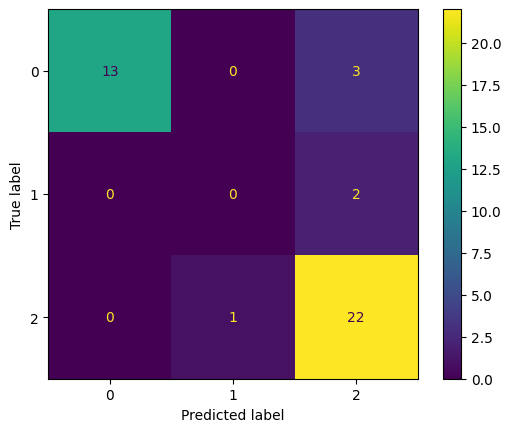

In [86]:
disp=ConfusionMatrixDisplay(cm_dt,display_labels=clf2.classes_)
disp.plot()
plt.show()

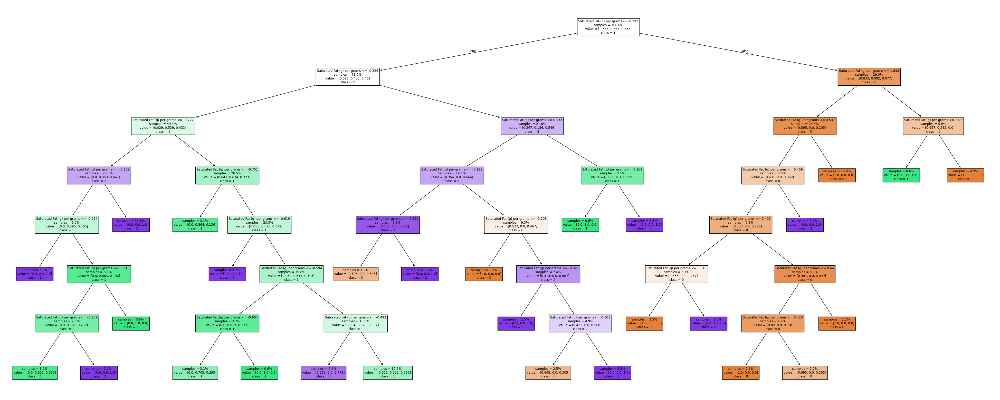

In [87]:
from sklearn.tree import plot_tree
plt.figure(figsize=(50,20))
plot_tree(clf2,
         feature_names=list(X_train_dt.columns),
          class_names=["0","1","2"],
          impurity=False,
          proportion=True,
          filled=True
         );


In [88]:
null_accuracy_dt=23/(23+2+13+3)
null_accuracy_dt

0.5609756097560976

#### Takeawys
<ul>
    <li>Models are not overfit, but test score is higher than train score.</li>
    <li>cluster 1 is scored 0 mainly due to thin grouping.</li>
    <li>Both scores are above null accuracy.</li>
</ul>

## Trainning model with SVM

In [89]:
from sklearn.svm import SVC
X=data.iloc[:,:4]
y=data_features["Clusters"]
from sklearn.preprocessing import StandardScaler
std_svm=StandardScaler()
X_train_svm,X_test_svm,y_train_svm,y_test_svm=train_test_split(X,y,test_size=0.2,random_state=24)
from sklearn.preprocessing import StandardScaler
std_svm=StandardScaler()
X_train_svm_std=std_svm.fit_transform(X_train_svm)
X_test_svm_std=std_svm.transform(X_test_svm)

In [90]:
svm=SVC(class_weight="balanced")
param_grid={"C":[0.01,0.1,1],"kernel":["linear","rbf"]}
grid_svm=GridSearchCV(svm,param_grid)
grid_svm.fit(X_train_svm_std,y_train_svm)
svm_best_params=grid_svm.best_params_
print(svm_best_params)

{'C': 1, 'kernel': 'linear'}


train score is 0.9012345679012346, test score is 0.8780487804878049
confusion matrix is 
[[ 8  1  1]
 [ 0  1  1]
 [ 2  0 27]]
              precision    recall  f1-score   support

           0       0.80      0.80      0.80        10
           1       0.50      0.50      0.50         2
           2       0.93      0.93      0.93        29

    accuracy                           0.88        41
   macro avg       0.74      0.74      0.74        41
weighted avg       0.88      0.88      0.88        41



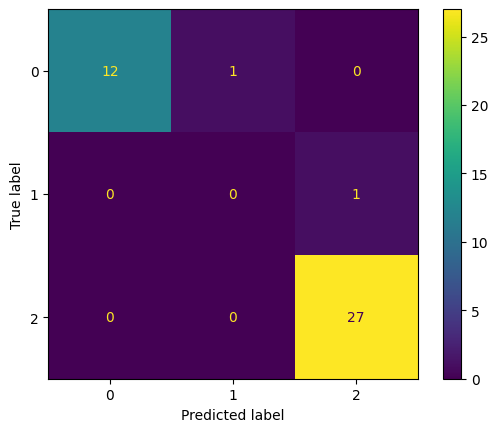

In [91]:
svm1=SVC(**svm_best_params,class_weight="balanced")
svm1.fit(X_train_svm_std,y_train_svm)
y_train_pred=svm1.predict(X_train_svm_std)
y_test_pred=svm1.predict(X_test_svm_std)
train_score=accuracy_score(y_train_pred,y_train_svm)
test_score=accuracy_score(y_test_pred,y_test_svm)
print(f"train score is {train_score}, test score is {test_score}")
cm_svm=confusion_matrix(y_test_svm,y_test_pred)
print(f"confusion matrix is \n{cm_svm}")
print(classification_report(y_test_pred,y_test_svm))
disp=ConfusionMatrixDisplay(cm,display_labels=svm1.classes_)
disp.plot()
plt.show()

In [92]:
null_accuracy_svm=29/(29+2+10)
null_accuracy_svm

0.7073170731707317

#### Takeawys
<ul>
    <li>High scores, slightly overfitting.</li>
    <li>cluster 1 is too thin.</li>
    <li>Both scores are above null accuracy.</li>
</ul>

## Trainning KNN model

In [93]:
X=data.iloc[:,:3]
y=data_features["Clusters"]
from sklearn.model_selection import train_test_split
X_train,X_test,y_train_knn,y_test_knn=train_test_split(X,y,test_size=0.2,random_state=24)
from sklearn.preprocessing import StandardScaler
std_knn=StandardScaler()
X_train_std_knn=std_knn.fit_transform(X_train)
X_test_std_knn=std_knn.transform(X_test)

In [94]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
knn_model=KNeighborsClassifier()
params={"n_neighbors":list(range(1,16))}
grid_knn=GridSearchCV(knn_model,params)
grid_knn.fit(X_train_std_knn,y_train_knn)
grid_knn.best_params_

C:\Users\Kun\2023anaconda\envs\Data_Science\Lib\site-packages\numpy\ma\core.py:2881: RuntimeWarning:

invalid value encountered in cast



{'n_neighbors': 9}

train score is 0.8827160493827161, test score is 0.9024390243902439
confusion matrix is 
[[ 8  0  2]
 [ 0  1  1]
 [ 1  0 28]]
              precision    recall  f1-score   support

           0       0.80      0.89      0.84         9
           1       0.50      1.00      0.67         1
           2       0.97      0.90      0.93        31

    accuracy                           0.90        41
   macro avg       0.76      0.93      0.81        41
weighted avg       0.92      0.90      0.91        41



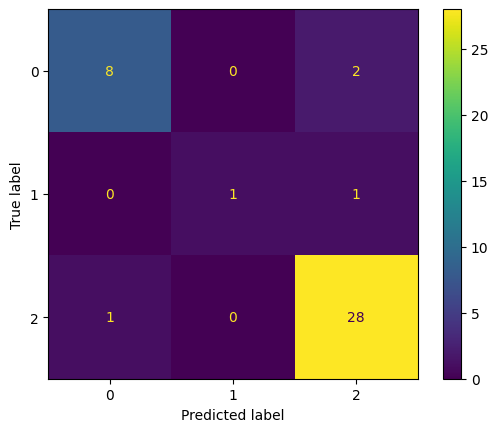

In [95]:
y_train_pred=grid_knn.predict(X_train_std_knn)
y_test_pred=grid_knn.predict(X_test_std_knn)
train_score=accuracy_score(y_train_pred,y_train_knn)
test_score=accuracy_score(y_test_pred,y_test_knn)
print(f"train score is {train_score}, test score is {test_score}")
cm_knn=confusion_matrix(y_test_knn,y_test_pred)
print(f"confusion matrix is \n{cm_knn}")
print(classification_report(y_test_pred,y_test_knn))
disp=ConfusionMatrixDisplay(cm_knn,display_labels=grid_knn.classes_)
disp.plot()
plt.show()

In [96]:
null_accuracy_knn=29/(29+10+2)
null_accuracy_knn

0.7073170731707317

<h4>Takeaways</h4>
<li>No overfit, but test is above train scores, and two scores are close to each other.</li>
<li>Both scores are above null accuracy</li>

## In conclusion:
<li>The LogisticRegression model is the best scored and the most well fit. Therefore, this model will be picked for prediction.</li>

## Part 5. Predictions.

<h3><p>Predict the classification of the Buttermilk from<a href="https://www.canada.ca/en/health-canada/services/food-nutrition/healthy-eating/nutrient-data/nutrient-value-some-common-foods-2008.html#a9"> StatsCan's website</a>.</p></h3>

In [97]:
predict=pd.DataFrame({
    "Food Name":"Buttermilk",
    "Measure":"250 ml",
    "Weight (g)":259,
    "Energy (kcal)":104,
    "Energy (kj)":432,
    "Protein (g)":9,
    "Carbohydrate (g)":12,
    "Total Sugar (g)":12,
    "Total Fat (g)":2,
    "Saturated Fat (g)":1.4,
    "Cholesterol (g)":10,
    "Calcium (mg)":300,
    "Iron (mg)":0.1,
    "Sodium (mg)":272,
    "Potassium (mg)":391,
    "Magnesium (mg)":28,
    "Phosphorus (mg)":230,
    "Vitamin A (RAE)":18,
    "Vitamin D (mcg)":0.2,
    "Folate (DFE)":13,
    "Vitamin B12 (mcg)":0.57,
    "Riboflavin (mg)":0.4
},index=[0])
predict

,Food Name,Measure,Weight (g),Energy (kcal),Energy (kj),Protein (g),Carbohydrate (g),Total Sugar (g),Total Fat (g),Saturated Fat (g),...,Iron (mg),Sodium (mg),Potassium (mg),Magnesium (mg),Phosphorus (mg),Vitamin A (RAE),Vitamin D (mcg),Folate (DFE),Vitamin B12 (mcg),Riboflavin (mg)
0,Buttermilk,250 ml,259,104,432,9,12,12,2,1.4,...,0.1,272,391,28,230,18,0.2,13,0.57,0.4


In [98]:
# Preprocess the prediction data.
p=predict.iloc[:,:3]
for col in predict.columns[3:]:
    p[f"{col} per grams"]=predict[col]/predict["Weight (g)"]
p    

,Food Name,Measure,Weight (g),Energy (kcal) per grams,Energy (kj) per grams,Protein (g) per grams,Carbohydrate (g) per grams,Total Sugar (g) per grams,Total Fat (g) per grams,Saturated Fat (g) per grams,...,Iron (mg) per grams,Sodium (mg) per grams,Potassium (mg) per grams,Magnesium (mg) per grams,Phosphorus (mg) per grams,Vitamin A (RAE) per grams,Vitamin D (mcg) per grams,Folate (DFE) per grams,Vitamin B12 (mcg) per grams,Riboflavin (mg) per grams
0,Buttermilk,250 ml,259,0.401544,1.667954,0.034749,0.046332,0.046332,0.007722,0.005405,...,0.000386,1.050193,1.509653,0.108108,0.888031,0.069498,0.000772,0.050193,0.002201,0.001544


In [99]:
features_log=data.iloc[:,:6].columns
features_log

Index(['Saturated Fat (g) per grams', 'Energy (kcal) per grams',
       'Cholesterol (mg) per grams', 'Iron (mg) per grams',
       'Polyunsaturated Fat (g) per grams', 'Vitamin A (RAE) per grams'],
      dtype='object')

In [100]:
#### 'Cholesterol (mg) per grams', sand 'Polyunsaturated Fat (g) per grams' are missing from the data. So they will be filled with 0.
p["Polyunsaturated Fat (g) per grams"]=0
p["Cholesterol (mg) per grams"]=0

In [101]:
X_predict=p[features_log]
X_predict

,Saturated Fat (g) per grams,Energy (kcal) per grams,Cholesterol (mg) per grams,Iron (mg) per grams,Polyunsaturated Fat (g) per grams,Vitamin A (RAE) per grams
0,0.005405,0.401544,0,0.000386,0,0.069498


In [102]:
X_predict_std=std_log.transform(X_predict)
logit.predict(X_predict_std)

array([2], dtype=int32)

#### The logisticRegression model classified the buttermilk as cluster2. 

#### Check with the mean value of Cluster 2.

In [103]:
data_features.query("Clusters==2").iloc[:,:-2].mean()

Energy (kcal) per grams              1.668344
Protein (g) per grams                0.248562
Saturated Fat (g) per grams          0.020117
Polyunsaturated Fat (g) per grams    0.009161
Cholesterol (mg) per grams           0.736840
Iron (mg) per grams                  0.022349
Sodium (mg) per grams                3.110548
Potassium (mg) per grams             3.206605
Phosphorus (mg) per grams            2.110410
Vitamin A (RAE) per grams            0.146733
Vitamin D (mcg) per grams            0.013948
Vitamin E (mg) per grams             0.004215
dtype: float64

#### Buttermilk nutrient fact

In [104]:
p.squeeze()

Food Name                            Buttermilk
Measure                                  250 ml
Weight (g)                                  259
Energy (kcal) per grams                0.401544
Energy (kj) per grams                  1.667954
Protein (g) per grams                  0.034749
Carbohydrate (g) per grams             0.046332
Total Sugar (g) per grams              0.046332
Total Fat (g) per grams                0.007722
Saturated Fat (g) per grams            0.005405
Cholesterol (g) per grams               0.03861
Calcium (mg) per grams                 1.158301
Iron (mg) per grams                    0.000386
Sodium (mg) per grams                  1.050193
Potassium (mg) per grams               1.509653
Magnesium (mg) per grams               0.108108
Phosphorus (mg) per grams              0.888031
Vitamin A (RAE) per grams              0.069498
Vitamin D (mcg) per grams              0.000772
Folate (DFE) per grams                 0.050193
Vitamin B12 (mcg) per grams            0

#### Takeaways
<p>Each feature of buttermilk contains less than the mean of cluster 2's counter part. It fit the character of cluster 2. Low at everything. Therefore, it's a match.</p>

## End
### Thank You!